In [9]:
import torch
import torchaudio
import os
from matplotlib import pyplot as plt
import numpy as np

In [10]:
def get_metadata(wav_path):
  metadata = torchaudio.info(wav_path)
  print(metadata)

def wav_read(wav_path):
  wav, fs= torchaudio.load(wav_path)
  if wav.shape[0] > 1:
    wav = wav[0,:]
  return wav, fs

def wav_read_30ms(waveform, sample_rate, start_time = 0):
  segment_duration = 0.03  # 30 ms
  start_sample = int(start_time * sample_rate)
  end_sample = int((start_time + segment_duration) * sample_rate)
  segment = waveform[start_sample:end_sample]
  time = np.arange(start_sample, end_sample) / sample_rate
  return segment, time

def plot_time_domain(wav, file):
  # Selecting only one channel
  plt.plot(wav)
  plt.title("Time  Domain Waveform" + file)
  plt.xlabel('time')
  plt.ylabel('amplitude')
  plt.show()

def plot_time_domain_30ms(time, segment, start_time=0):
  # Selecting only one channel
  plt.plot(time, segment.numpy(), color='green')
  plt.title(f"30 ms Segment at {start_time}s")
  plt.xlabel('time')
  plt.ylabel('amplitude')
  plt.show()


def fft_plot(wav, start, end, fs):
  frame = wav[int(start*fs):int((end)*fs)]
  N = frame.shape[-1]
  print(frame.shape)
  frame_fft = np.fft.fft(frame)
  frame_fft_abs = np.abs(frame_fft)
  plt.subplot(2,1,1)
  plt.plot(frame)
  plt.xlabel('time')
  plt.ylabel('amplitude')
  plt.subplot(2,1,2)
  x_axis = np.arange(frame.shape[-1]//2) * fs/N
  plt.plot(x_axis, 20*np.log10(frame_fft_abs)[:frame.shape[-1]//2])
  plt.xlabel('frequency')
  plt.ylabel('magnitude')
  plt.show()

def resample(wav, original_fs ,new_fs):
  sample_rate = original_fs
  resample_rate = new_fs
  resampler = T.Resample(sample_rate, resample_rate)
  resampled_waveform = resampler(wav)
  return  resampled_waveform, new_fs

def resample_bit_change(wav, original_fs ,new_fs, target_bit):
  sample_rate = original_fs
  resample_rate = new_fs
  resampler = T.Resample(sample_rate, resample_rate)
  resampled_waveform = resampler(wav)
  quantization_levels = 2 ** target_bit
  quantized_wav = torch.round(resampled_waveform * (quantization_levels / 2 - 1)) / (quantization_levels / 2 - 1)
  return  quantized_wav, new_fs

def get_all_files_in_folder(directory_path):
    # Recursively get all files in the directory and subdirectories
    all_files = []
    for root, dirs, files in os.walk(directory_path):
        for file in files:
            all_files.append(os.path.join(root, file))
    return all_files

# Speech Recording
- Record speech data for all the sound units in your mother tongue as listed in the theory.
- Use a 16 kHz sampling frequency and 16 bits/sample resolution for all recordings.

# Bengali Phonetic Table

## Vowels

| **Type**          | **Vowels**                          |
|--------------------|-------------------------------------|
| Short Vowels       | অ (a), ই (i), উ (u)                 |
| Long Vowels        | আ (ā), ঈ (ī), ঊ (ū)                 |
| Diphthongs         | ঐ (oi), ঔ (ou)                     |

---

## Consonants

| **Category**       | **Consonants**                                            |
|--------------------|----------------------------------------------------------|
| Stops             | ক (ka), খ (kha), গ (ga), ঘ (gha), ঙ (nga)                 |
|                   | চ (cha), ছ (chha), জ (ja), ঝ (jha), ঞ (nya)               |
|                   | ট (ṭa), ঠ (ṭha), ড (ḍa), ঢ (ḍha), ণ (ṇa)                  |
|                   | ত (ta), থ (tha), দ (da), ধ (dha), ন (na)                  |
|                   | প (pa), ফ (pha), ব (ba), ভ (bha), ম (ma)                  |
| Nasals            | ঙ (nga), ঞ (nya), ণ (ṇa), ন (na), ম (ma)                 |
| Fricatives        | শ (sha), ষ (ṣa), স (sa), হ (ha)                           |
| Semivowels        | য (ya), র (ra), ল (la), ঴ (ṛa), য় (ẏa)                  |
| Affricates        | চ (cha), ছ (chha), জ (ja), ঝ (jha)                       |

---

## For Stops Consonents

When recording stop consonants, include vowels both before and after the stop consonants.

### Example:
| **Stop Consonant** | **Recording** |
|--------------------|---------------|
| ক (ka)             | aka           |
| খ (kha)            | akha          |
| গ (ga)             | aga           |
| ঘ (gha)            | agha          |
| চ (cha)            | acha          |
| ছ (chha)           | achha         |
| জ (ja)             | aja           |
| ঝ (jha)            | ajha          |
| প (pa)             | apa           |
| ফ (pha)            | apha          |


# Sound Units to Record
- Vowels: Short vowels, Long vowels, and Diphthongs
- Consonants:
    - Stops
    - Nasals
    - Fricatives
    - Semivowels
    - Affricates
- Special Instructions for Stops: When recording stop consonants, include vowels both before and after the stop consonants. Example: Record "akha" where "kha" is the stop consonant, and "a" is a short vowel.

# Analysis and Plotting
For each sound unit: 
a. Plot the time-domain waveform of the entire speech data. 
b. Plot 30 ms segments to observe the expanded version. 
c. Plot the log magnitude spectrum

In [11]:
# Function to load audio data
def load_audio(file_path):
    waveform, sample_rate = torchaudio.load(file_path)
    return waveform, sample_rate

# Function to plot the combined graphs
def plot_combined_with_full_waveform(file_path, start_time=0):
    # Load audio
    waveform, sample_rate = load_audio(file_path)
    waveform = waveform[0]  # Use the first channel if stereo
    total_time = np.arange(waveform.size(0)) / sample_rate

    # Extract 30ms segment
    segment_duration = 0.03  # 30 ms
    start_sample = int(start_time * sample_rate)
    end_sample = int((start_time + segment_duration) * sample_rate)
    segment = waveform[start_sample:end_sample]
    time_segment = np.arange(start_sample, end_sample) / sample_rate

    # FFT for log magnitude spectrum
    N = len(segment)
    fft_result = torch.fft.fft(segment)  # FFT computation
    freqs = np.fft.fftfreq(N, d=1 / sample_rate)[:N // 2]  # Positive frequencies
    magnitude_spectrum = np.abs(fft_result)[:N // 2]
    log_magnitude = np.log10(magnitude_spectrum + 1e-6)

    # Plotting
    plt.figure(figsize=(12, 12))
    
    # Full speech time-domain waveform
    plt.subplot(3, 1, 1)
    plt.plot(total_time, waveform.numpy(), color='blue')
    plt.title(f"Full Waveform for {os.path.basename(file_path)}")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    
    # Time-domain plot of the 30ms segment
    plt.subplot(3, 1, 2)
    plt.plot(time_segment, segment.numpy(), color='green')
    plt.title(f"30 ms Segment for {os.path.basename(file_path)}")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    
    # Log magnitude spectrum of the 30ms segment
    plt.subplot(3, 1, 3)
    plt.plot(freqs, log_magnitude, color='red')
    plt.title(f"Log Magnitude Spectrum for 30 ms Segment")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Log Magnitude")
    
    # Adjust layout and show
    plt.tight_layout()
    plt.show()


## Vowels - Short Vowels
- Shorter in duration
- More steady pattern than consonents
- Smooth pattern
- The log magnitude spectrum  reflects the periodicity of the sound.

C:\Users\ghs6kor\AppData\Local\Temp\ipykernel_34192\1710049350.py:24: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  magnitude_spectrum = np.abs(fft_result)[:N // 2]
C:\Users\ghs6kor\AppData\Local\Temp\ipykernel_34192\1710049350.py:25: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  log_magnitude = np.log10(magnitude_spectrum + 1e-6)


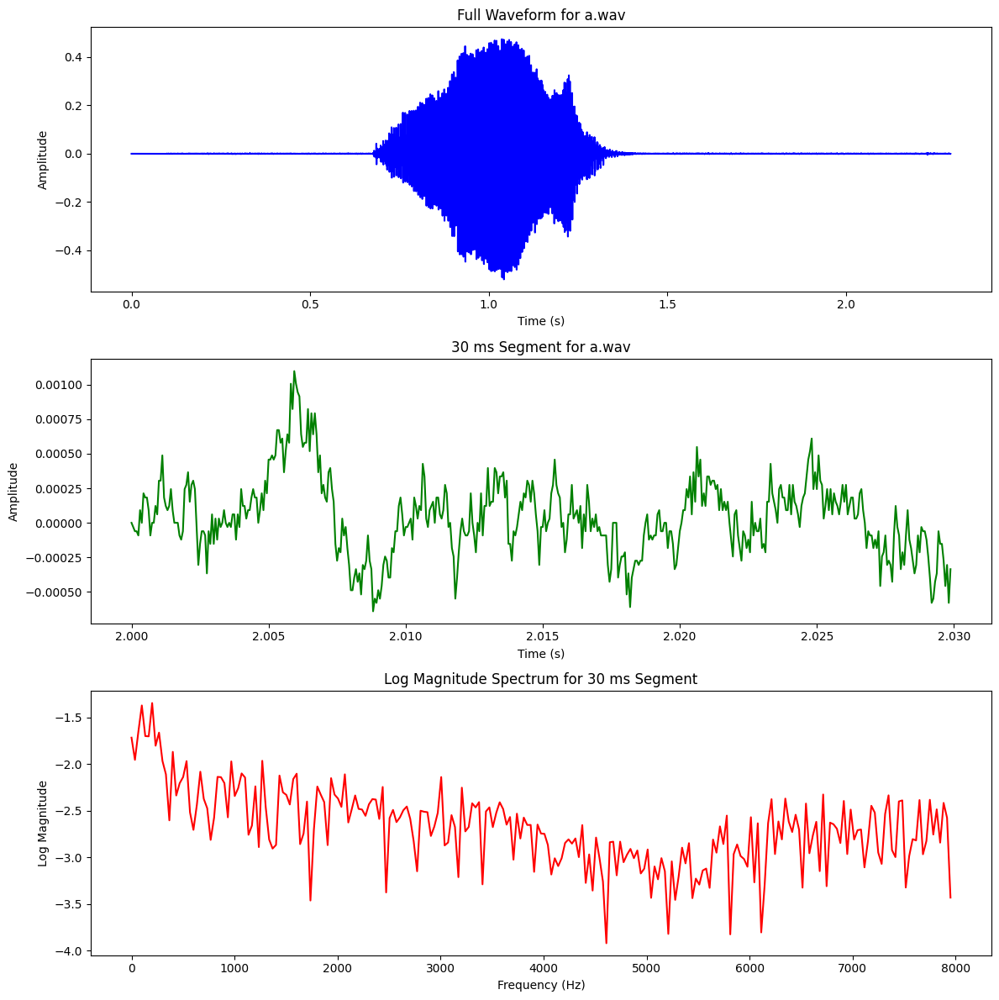

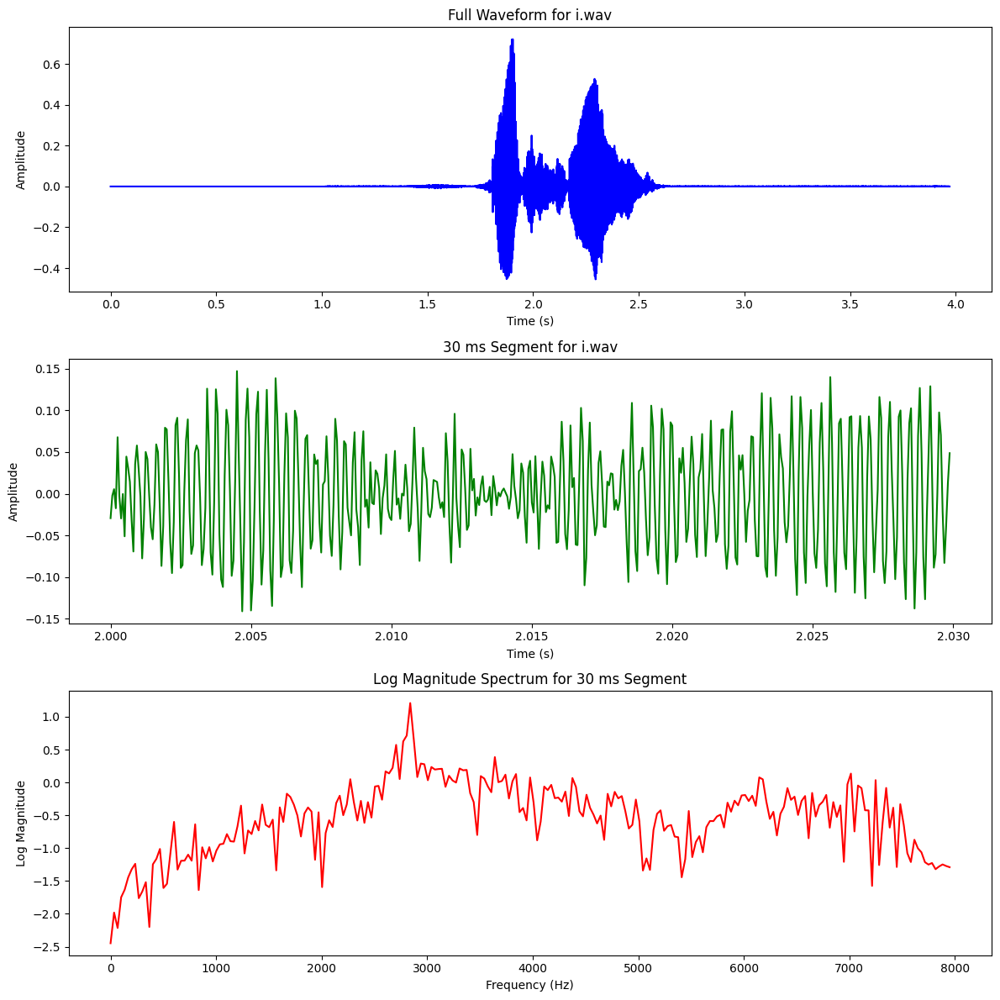

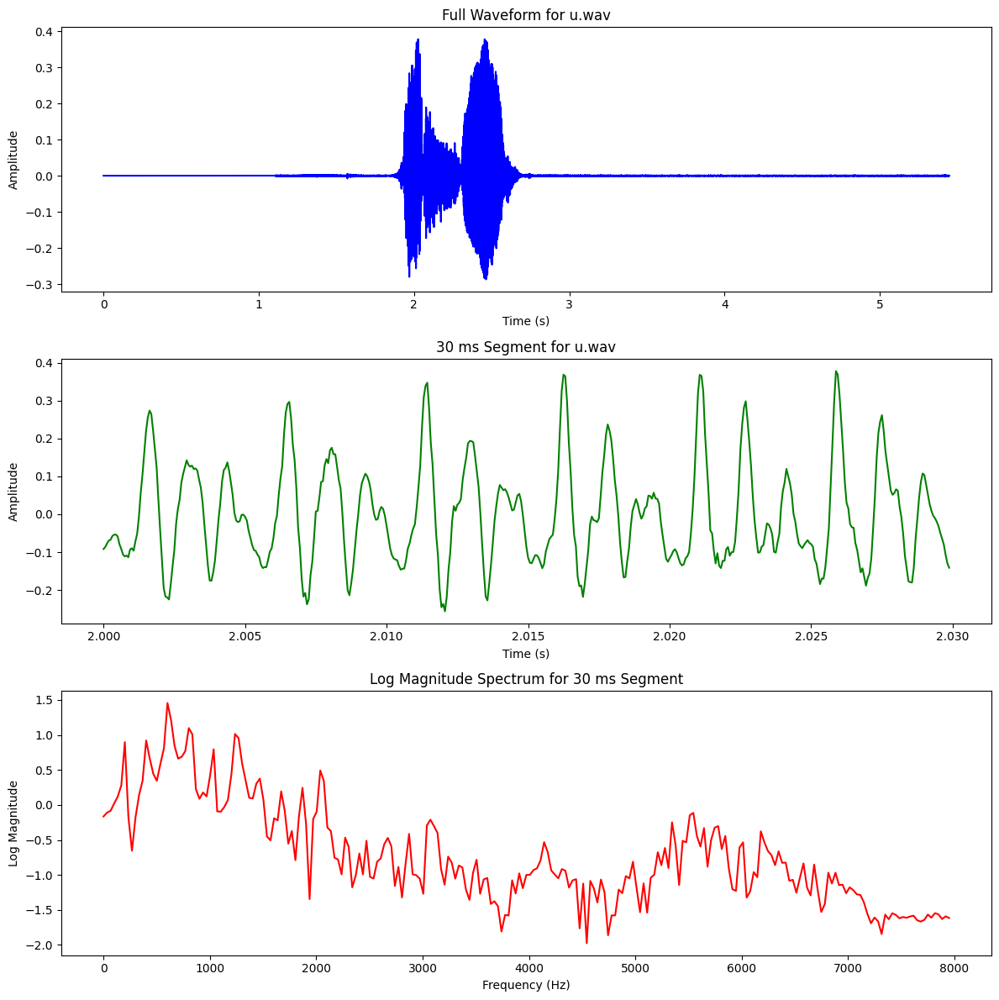

In [12]:
##
folder_path = "Vowels\\Short_Vowels"
files = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith('.wav')]

for file in files:
    plot_combined_with_full_waveform(file, start_time=2)

## Vowels - Long Vowels



C:\Users\ghs6kor\AppData\Local\Temp\ipykernel_34192\1710049350.py:24: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  magnitude_spectrum = np.abs(fft_result)[:N // 2]
C:\Users\ghs6kor\AppData\Local\Temp\ipykernel_34192\1710049350.py:25: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  log_magnitude = np.log10(magnitude_spectrum + 1e-6)


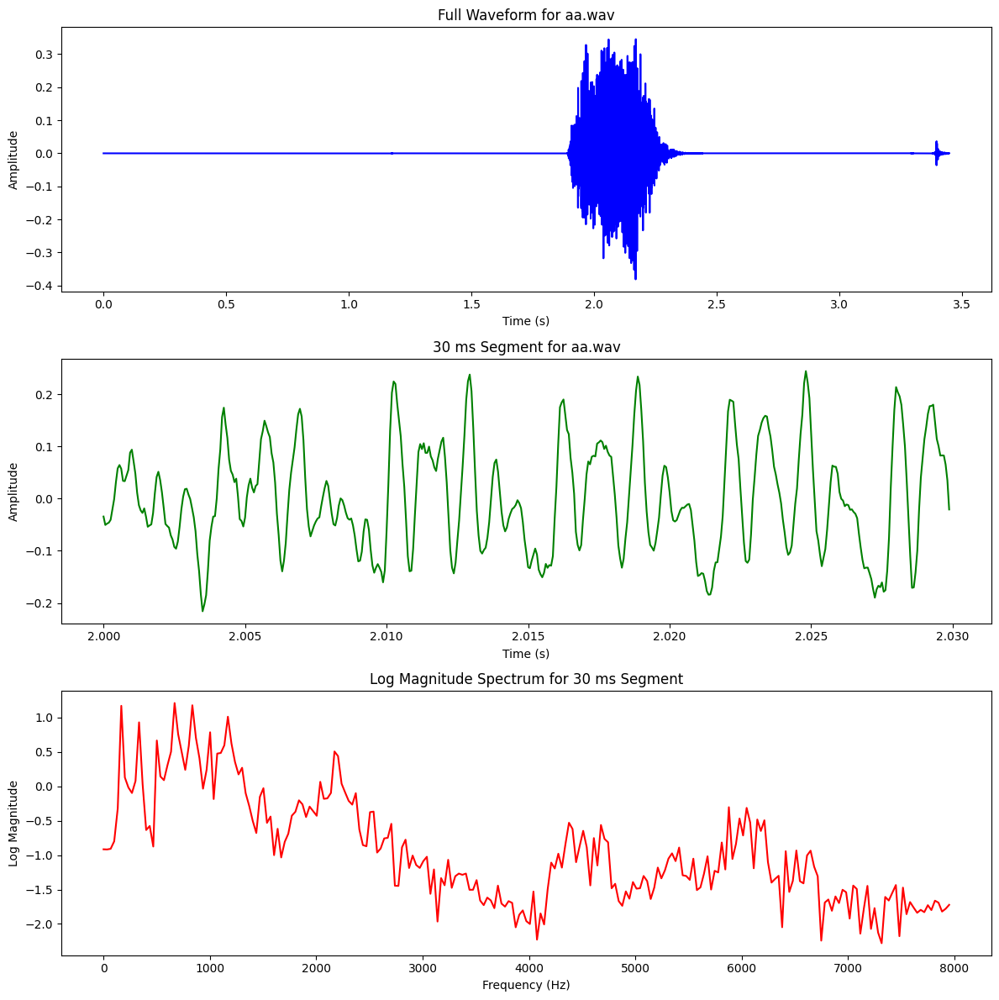

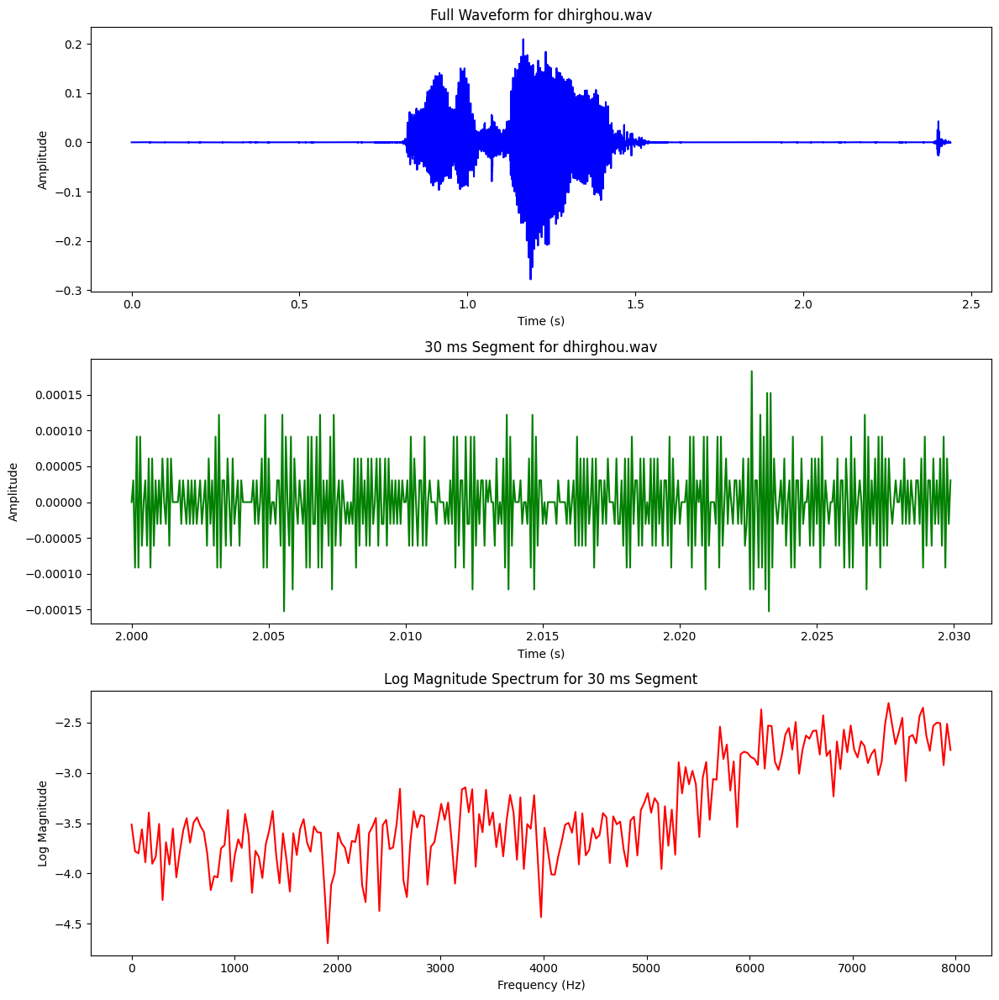

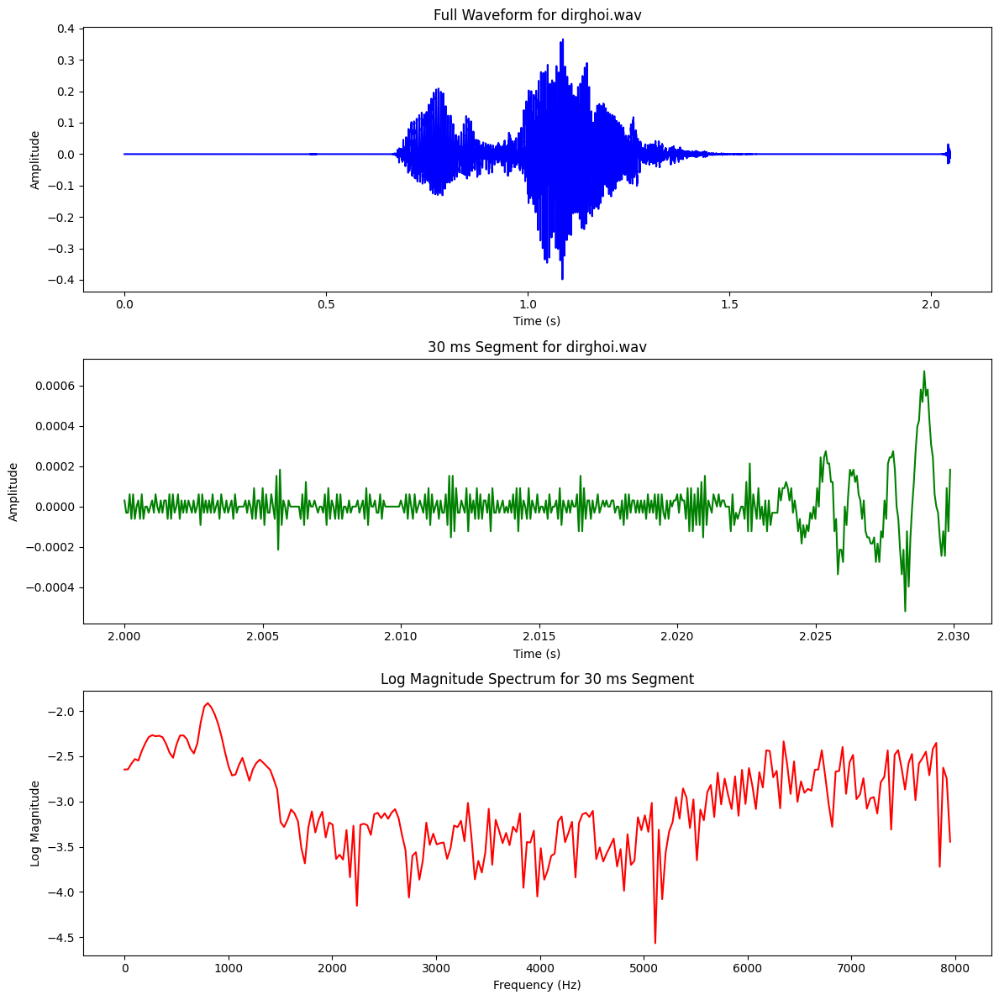

In [13]:
##
folder_path = "Vowels\\Long_Vowels"
files = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith('.wav')]

for file in files:
    plot_combined_with_full_waveform(file, start_time=2)

## Dipthongs

C:\Users\ghs6kor\AppData\Local\Temp\ipykernel_34192\1710049350.py:24: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  magnitude_spectrum = np.abs(fft_result)[:N // 2]
C:\Users\ghs6kor\AppData\Local\Temp\ipykernel_34192\1710049350.py:25: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  log_magnitude = np.log10(magnitude_spectrum + 1e-6)


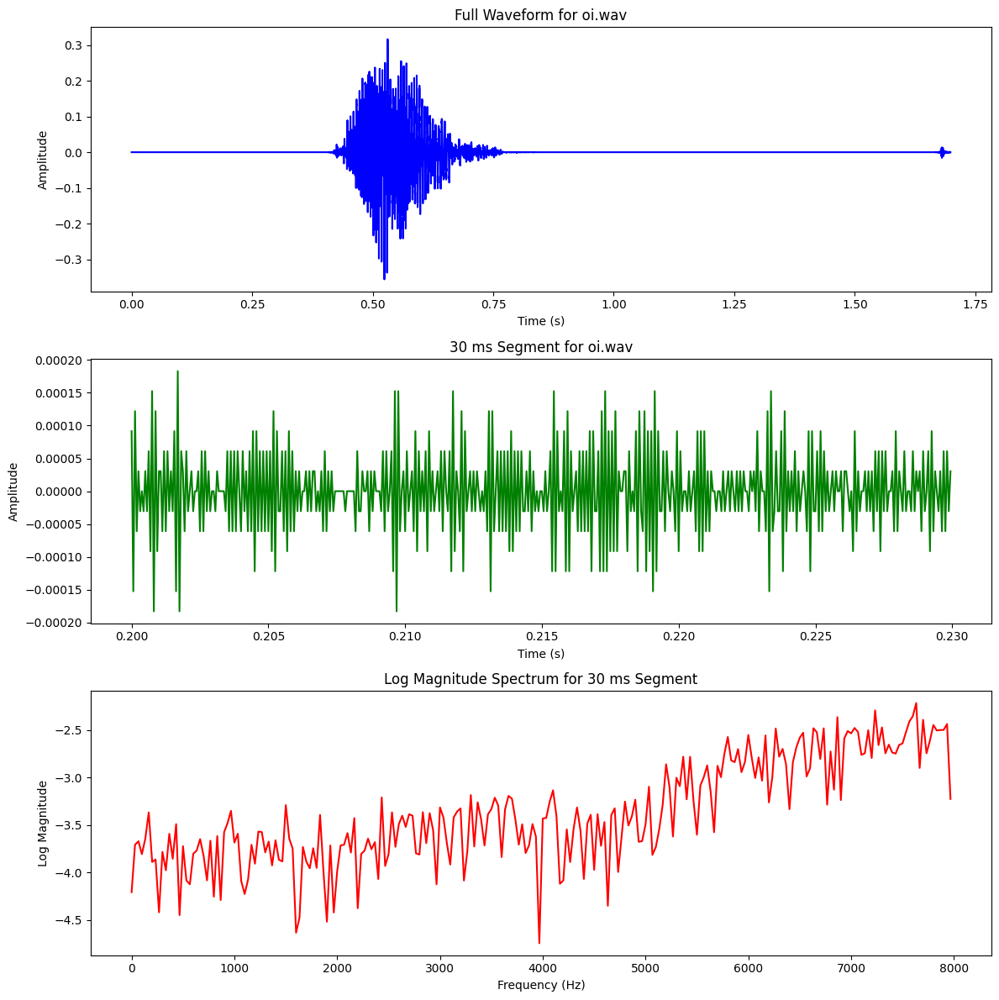

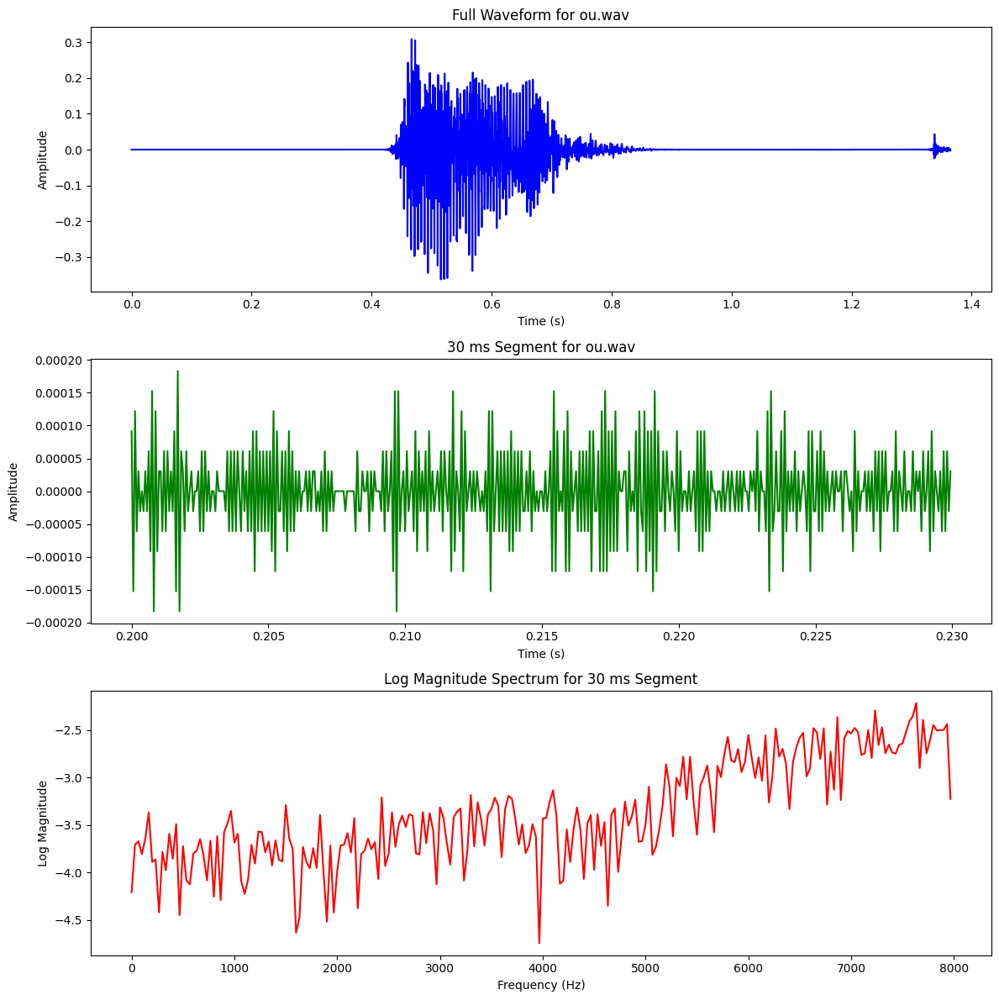

In [14]:
##
folder_path = "Vowels\\Dipthongs"
files = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith('.wav')]

for file in files:
    plot_combined_with_full_waveform(file, start_time=0.2)

## Consonents - Stops

C:\Users\ghs6kor\AppData\Local\Temp\ipykernel_34192\1710049350.py:24: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  magnitude_spectrum = np.abs(fft_result)[:N // 2]
C:\Users\ghs6kor\AppData\Local\Temp\ipykernel_34192\1710049350.py:25: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  log_magnitude = np.log10(magnitude_spectrum + 1e-6)


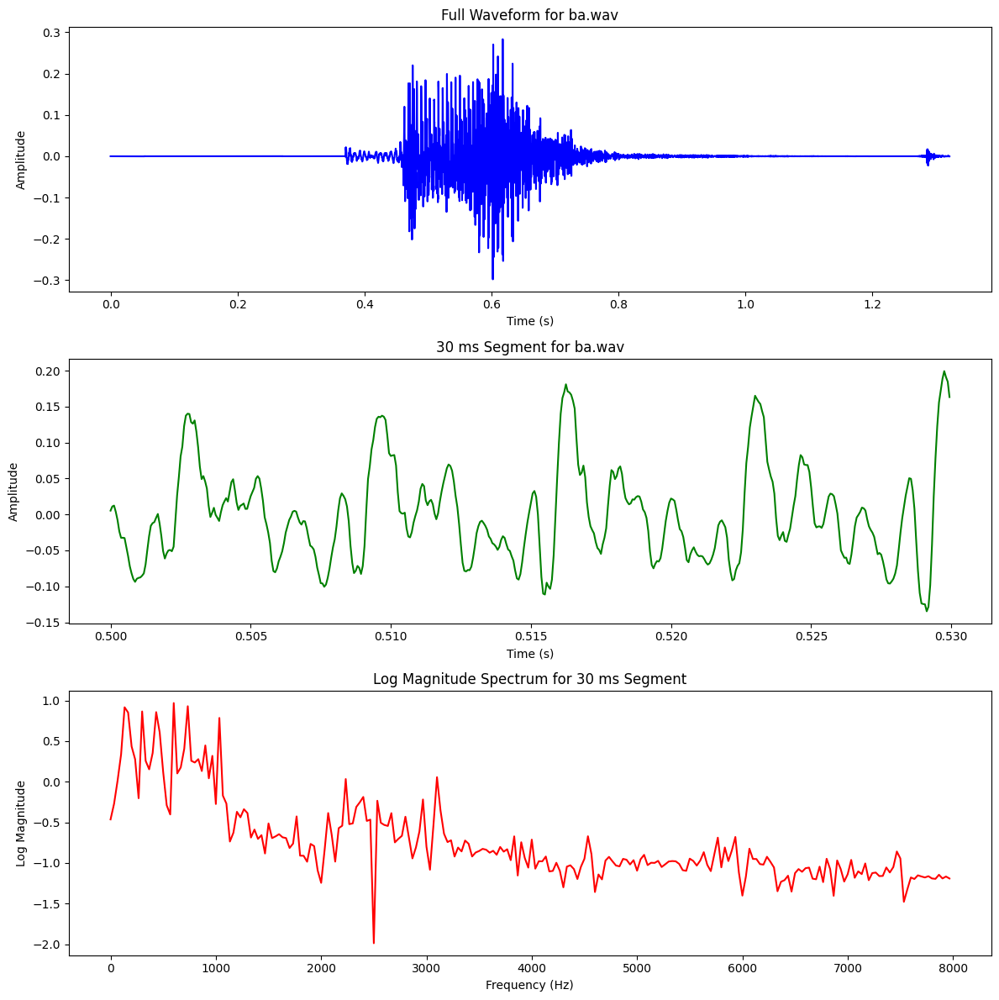

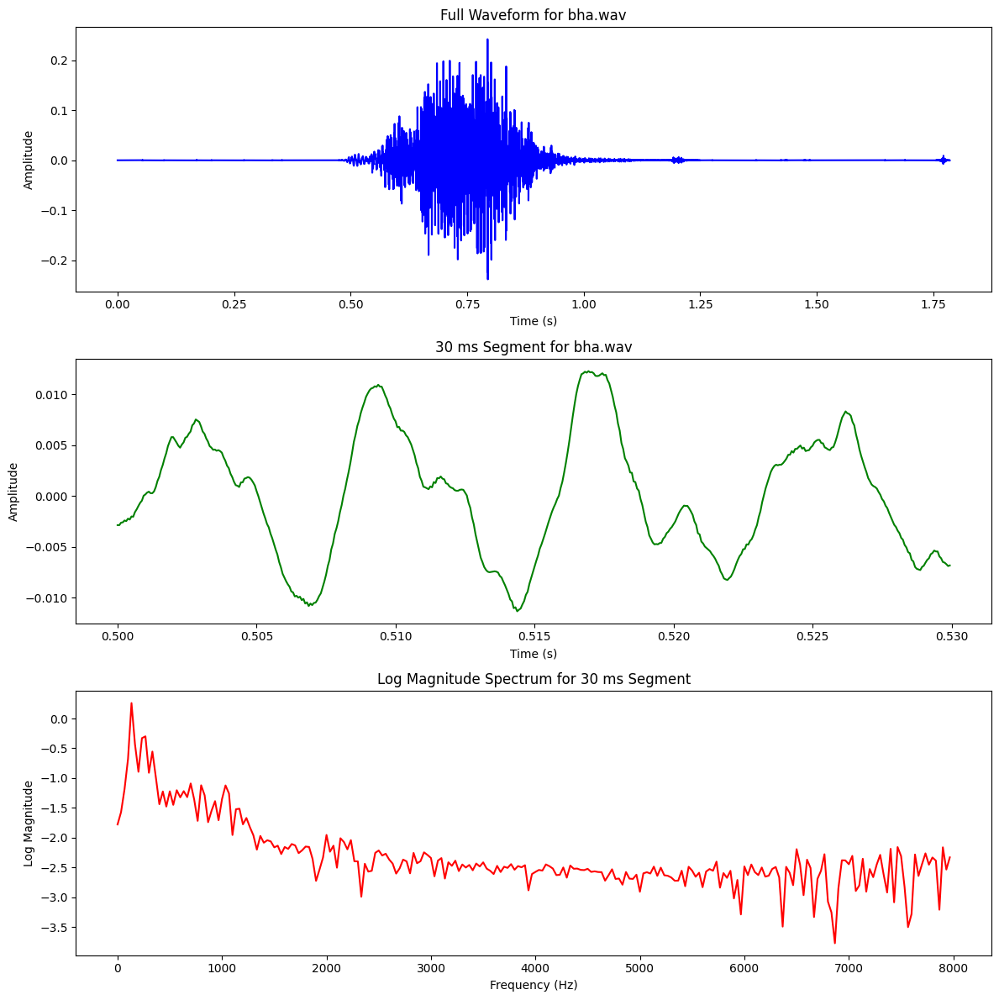

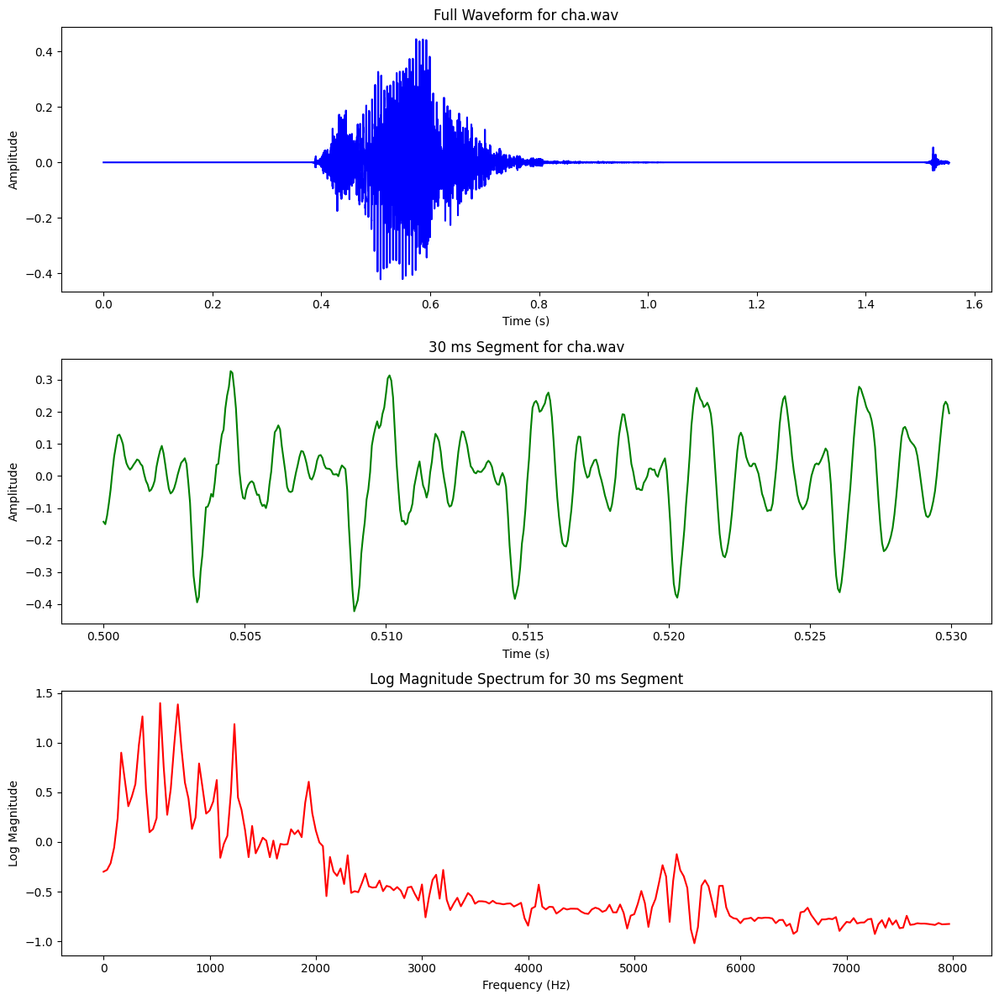

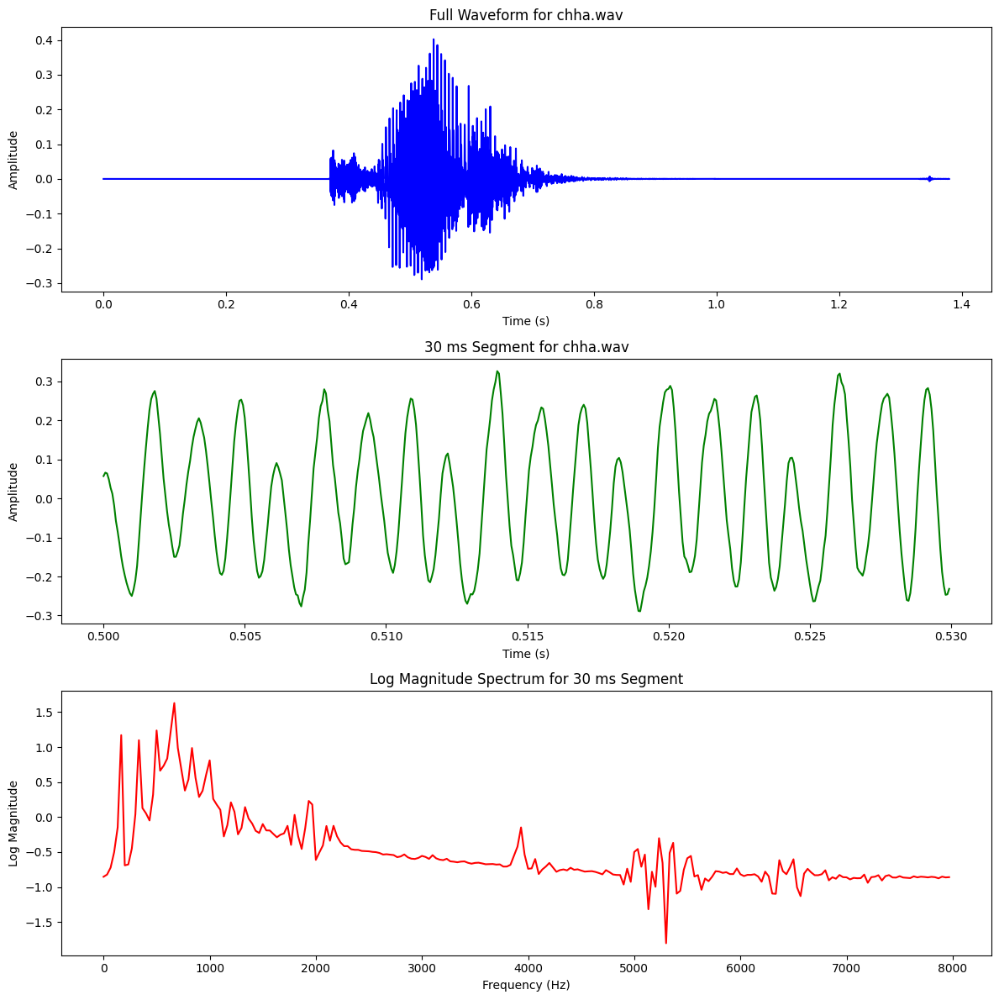

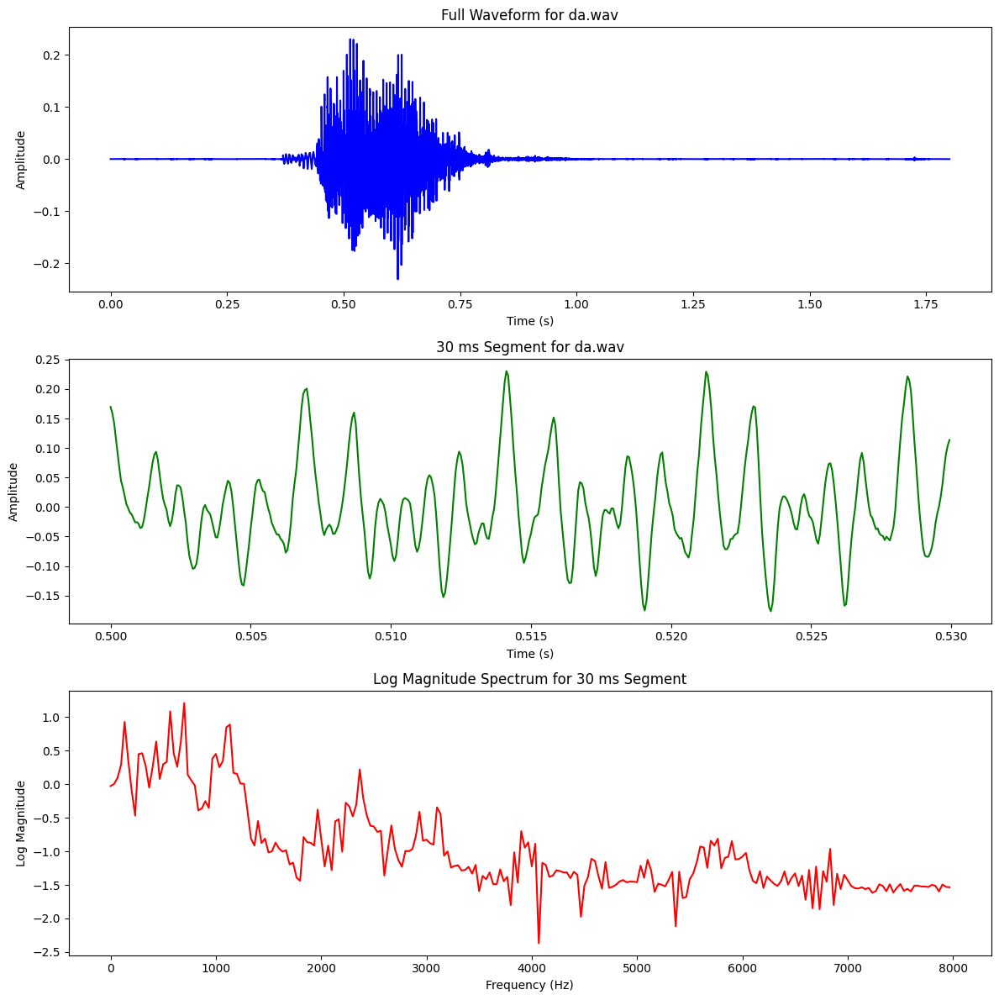

...

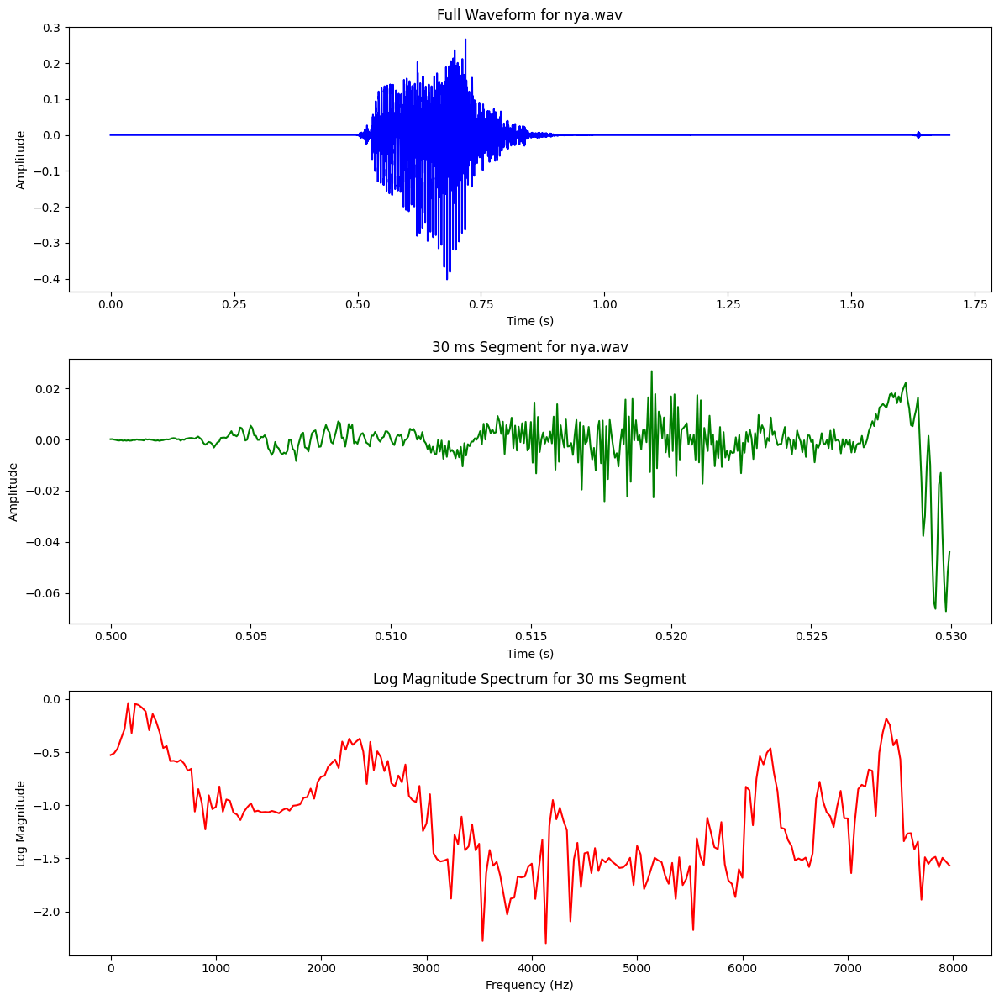

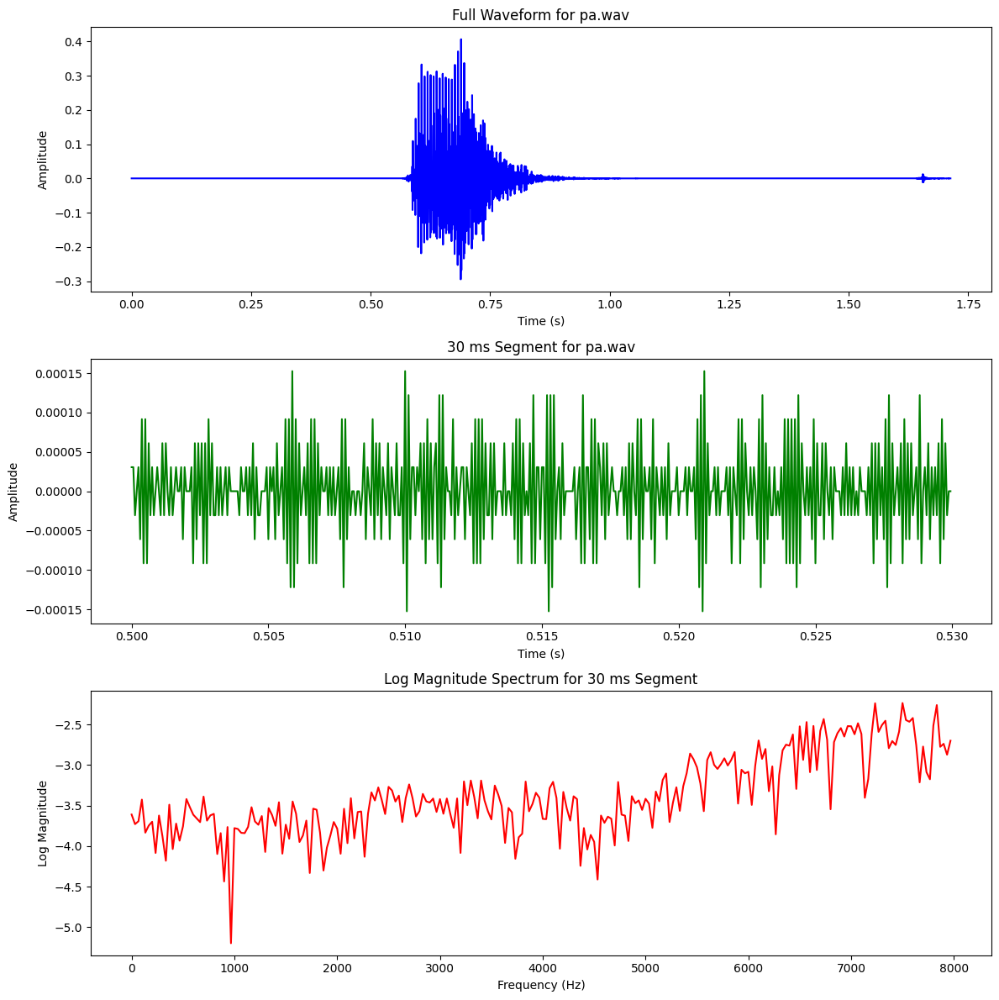

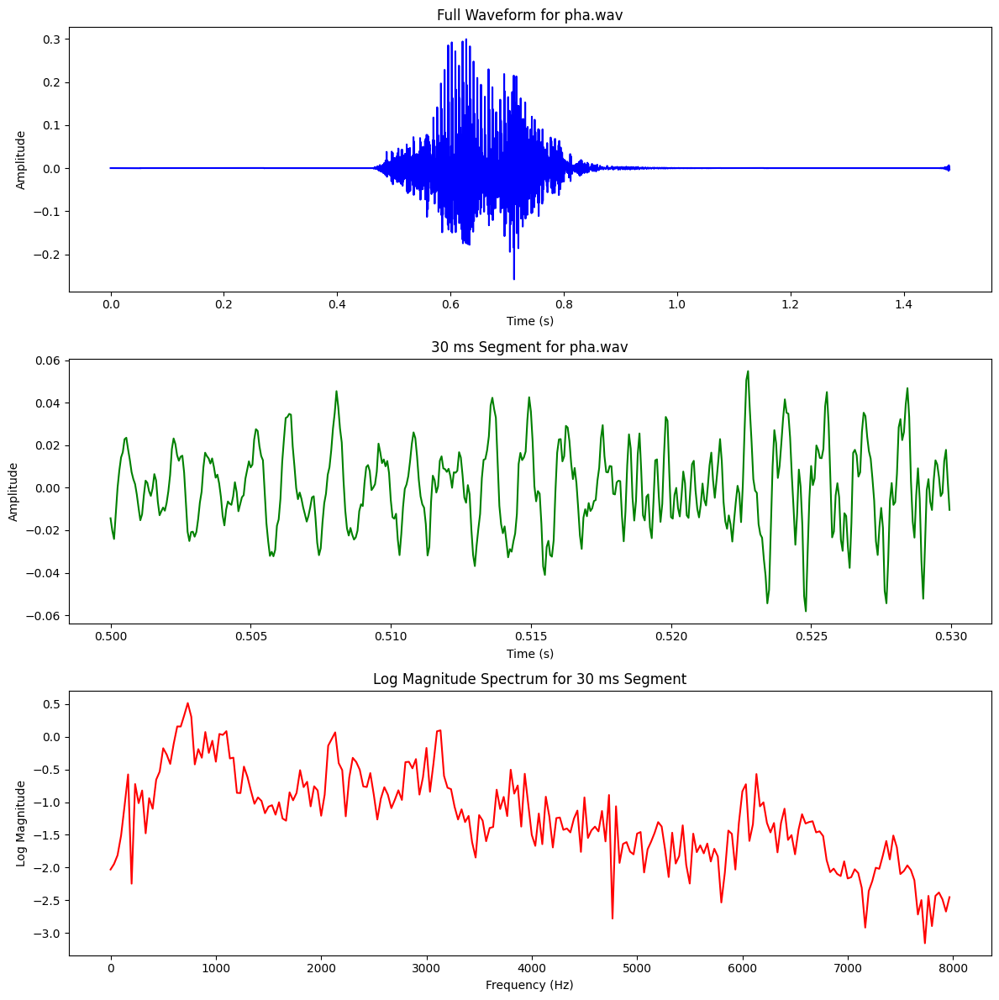

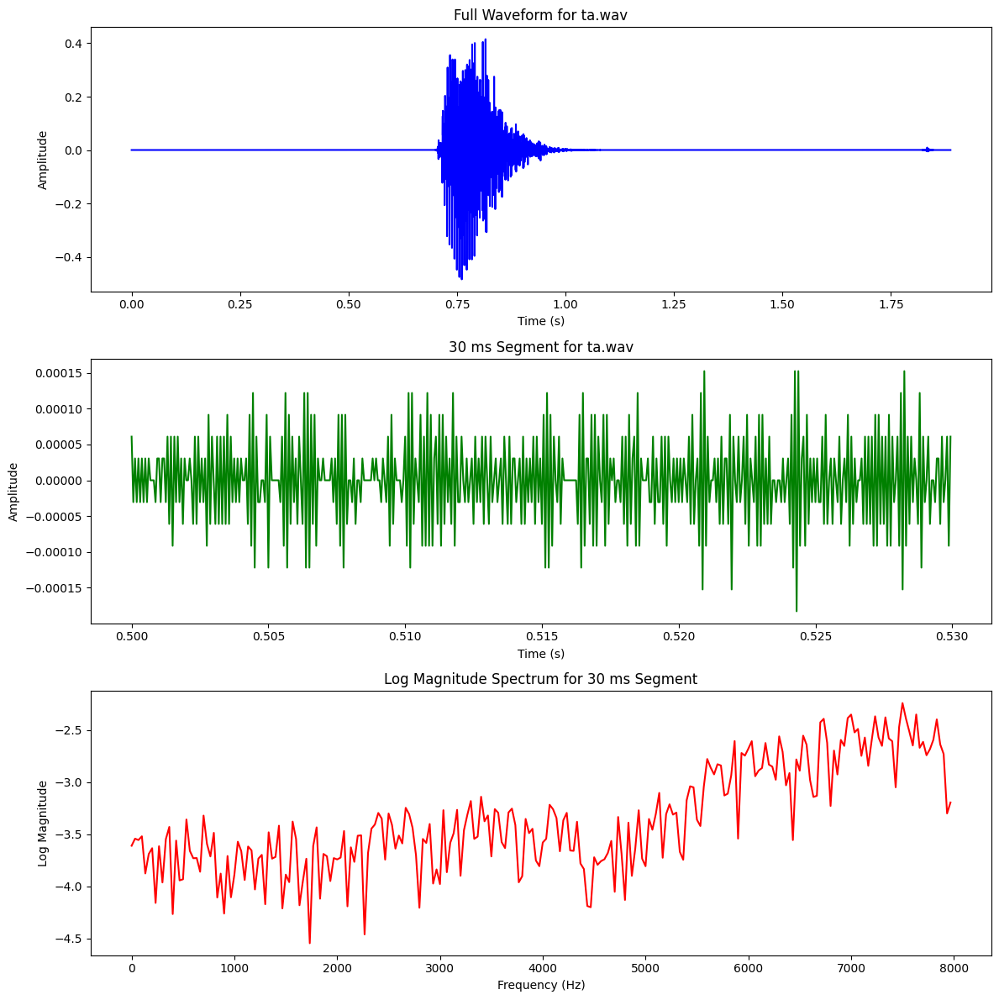

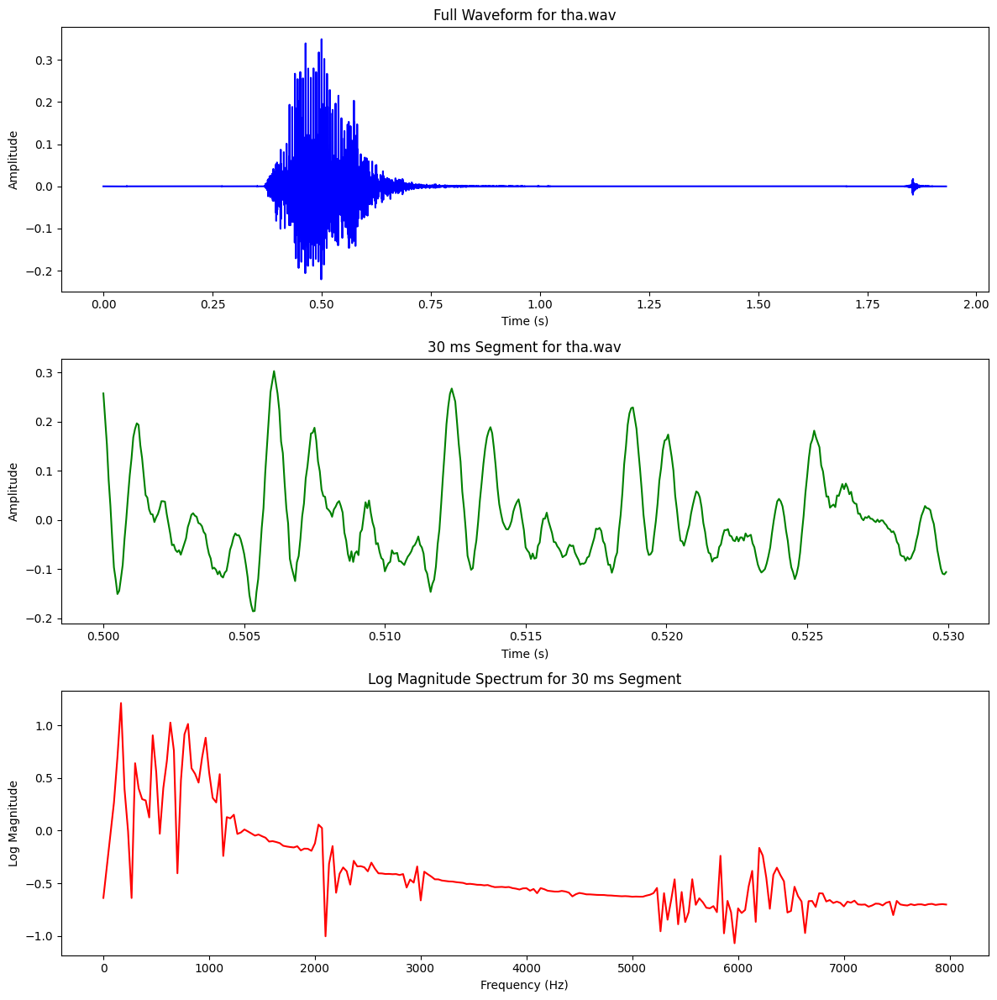

In [15]:
##
folder_path = "Consonants\\Stops"
files = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith('.wav')]

for file in files:
    plot_combined_with_full_waveform(file, start_time=0.5)

## Consonents - Nasal   

C:\Users\ghs6kor\AppData\Local\Temp\ipykernel_34192\1710049350.py:24: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  magnitude_spectrum = np.abs(fft_result)[:N // 2]
C:\Users\ghs6kor\AppData\Local\Temp\ipykernel_34192\1710049350.py:25: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  log_magnitude = np.log10(magnitude_spectrum + 1e-6)


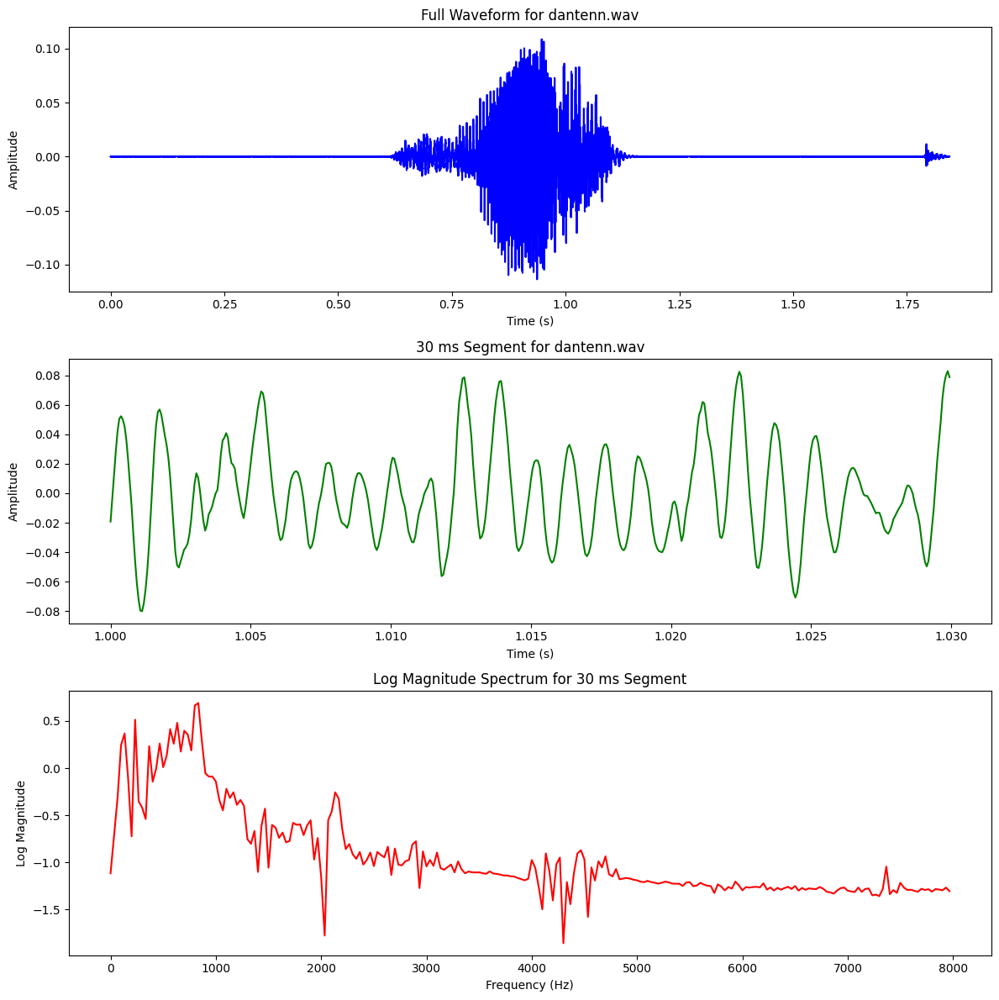

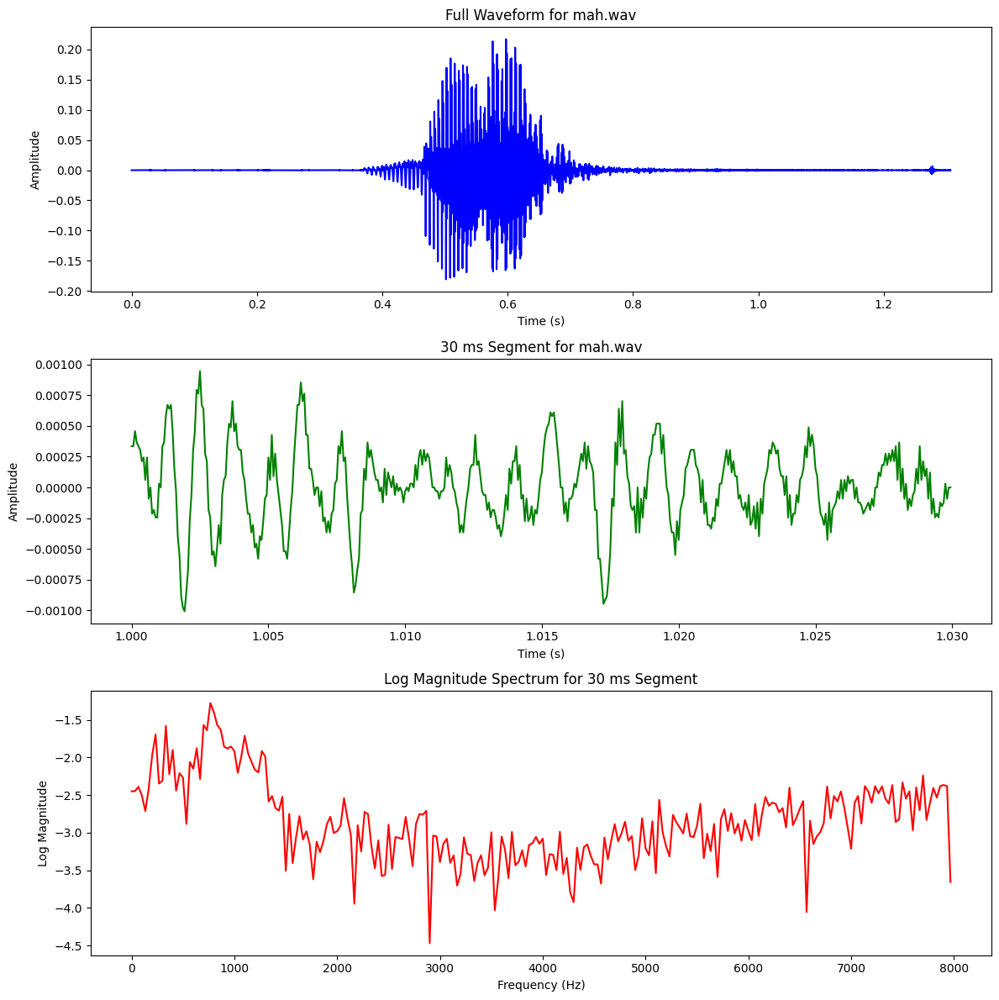

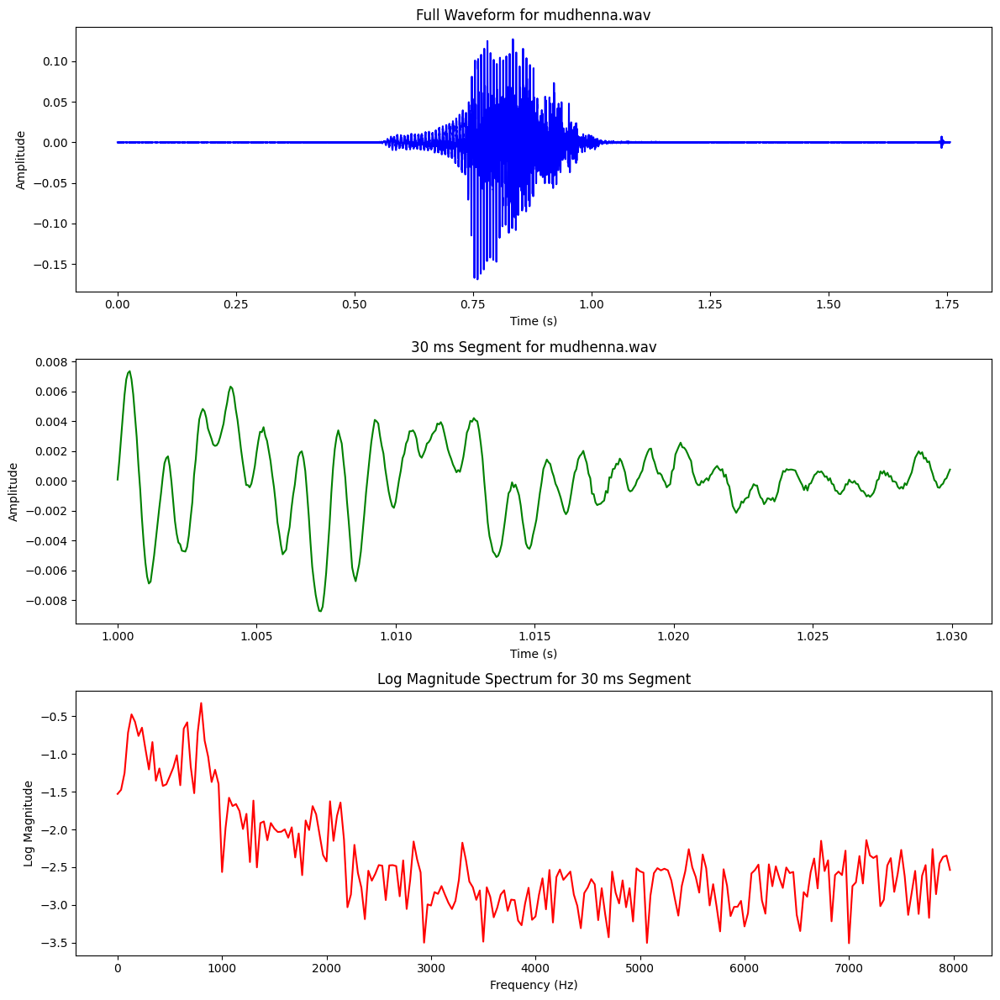

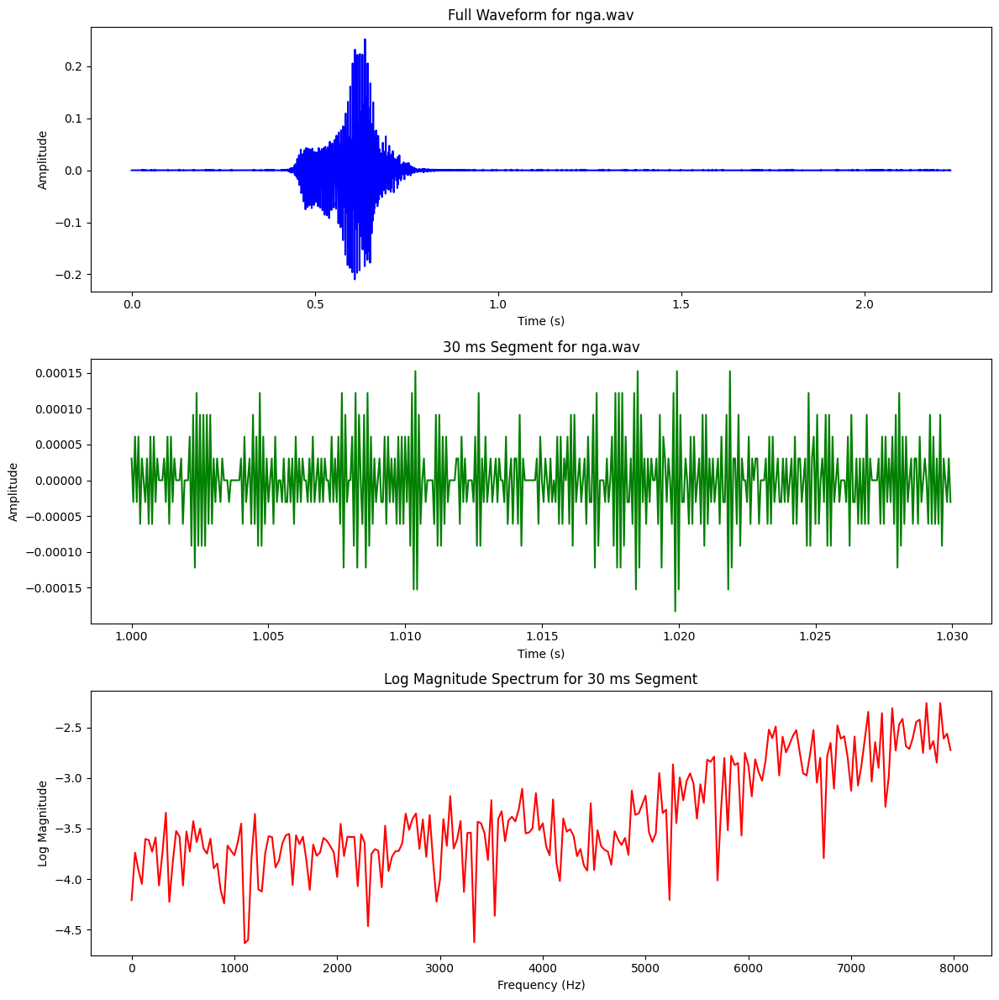

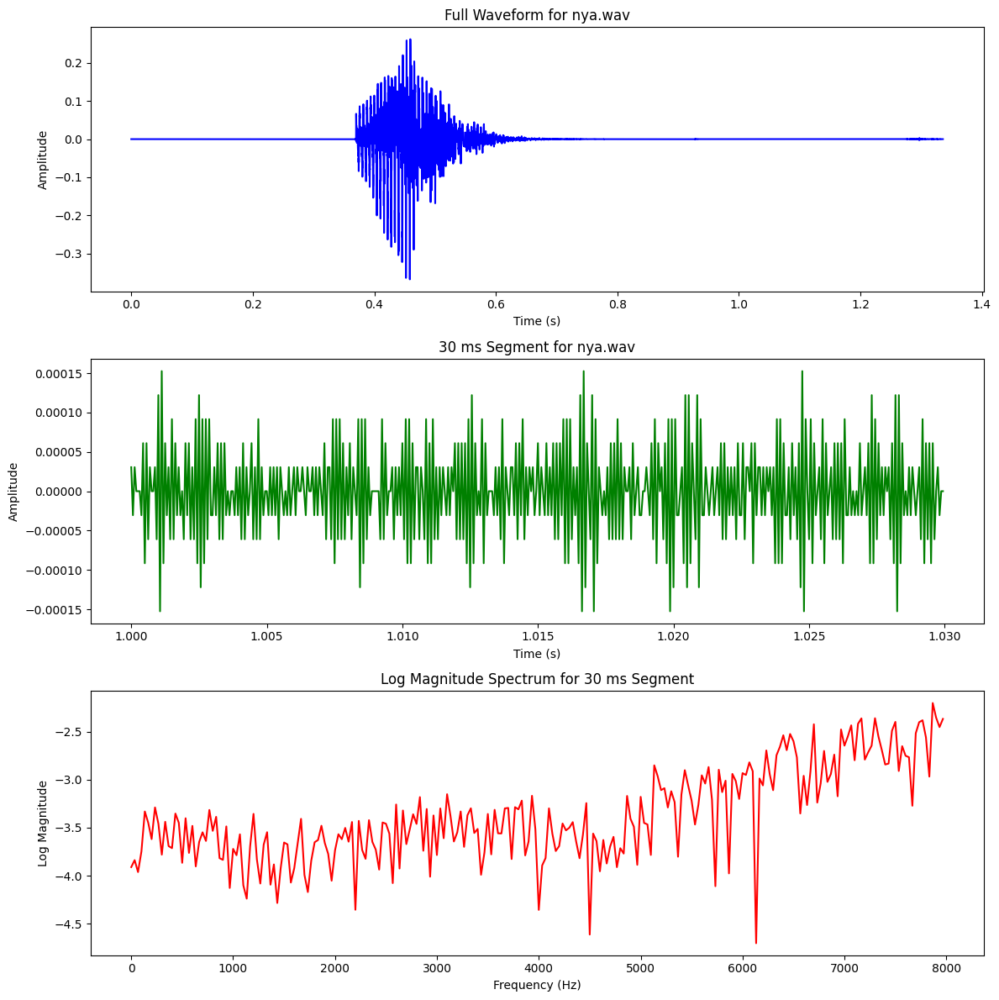

In [16]:
##
folder_path = "Consonants\\Nasals"
files = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith('.wav')]

for file in files:
    plot_combined_with_full_waveform(file, start_time=1.0)

## Consonents - Fricatives

C:\Users\ghs6kor\AppData\Local\Temp\ipykernel_34192\1710049350.py:24: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  magnitude_spectrum = np.abs(fft_result)[:N // 2]
C:\Users\ghs6kor\AppData\Local\Temp\ipykernel_34192\1710049350.py:25: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  log_magnitude = np.log10(magnitude_spectrum + 1e-6)


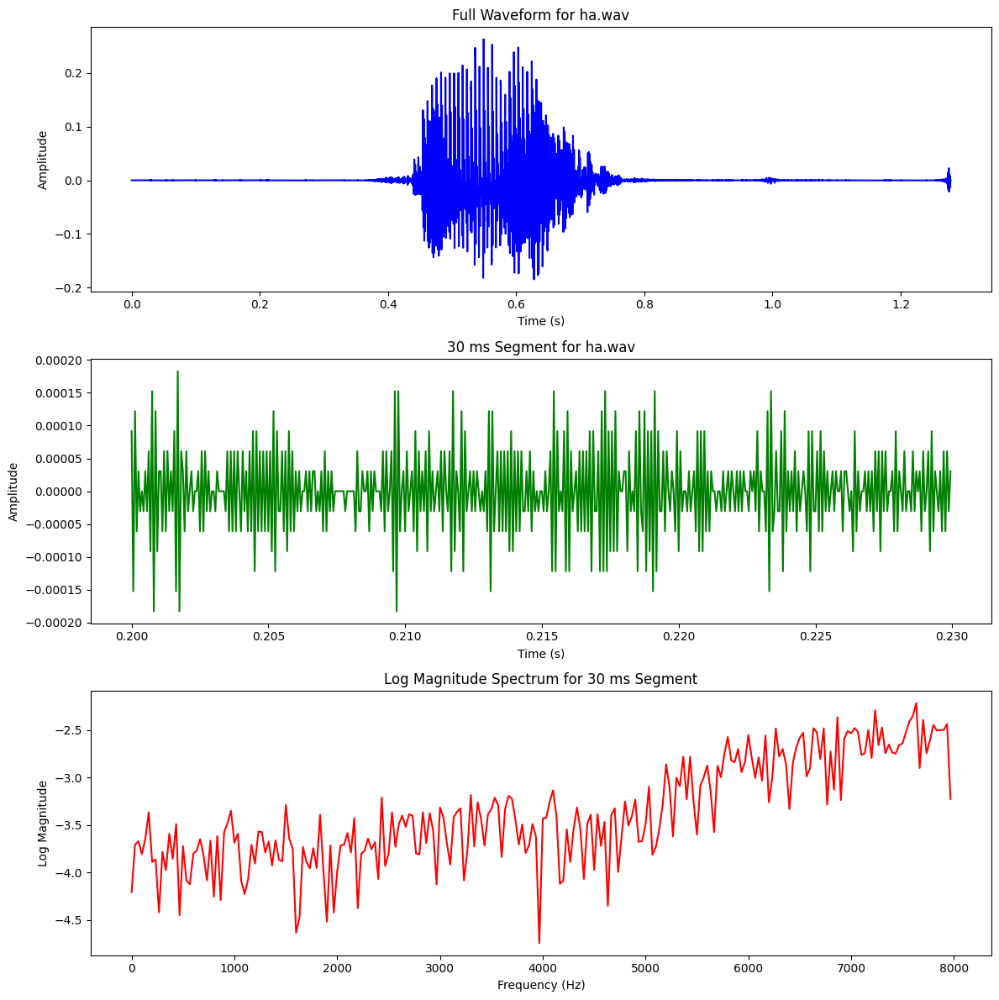

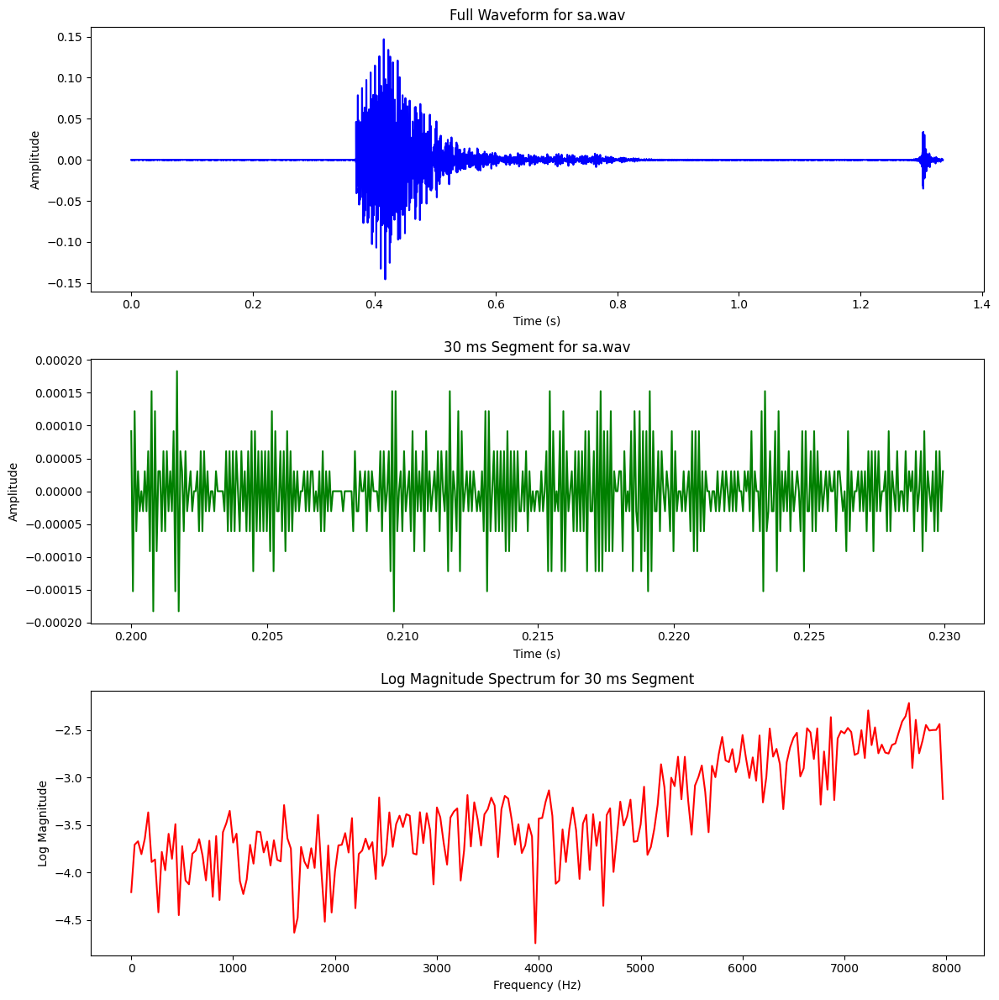

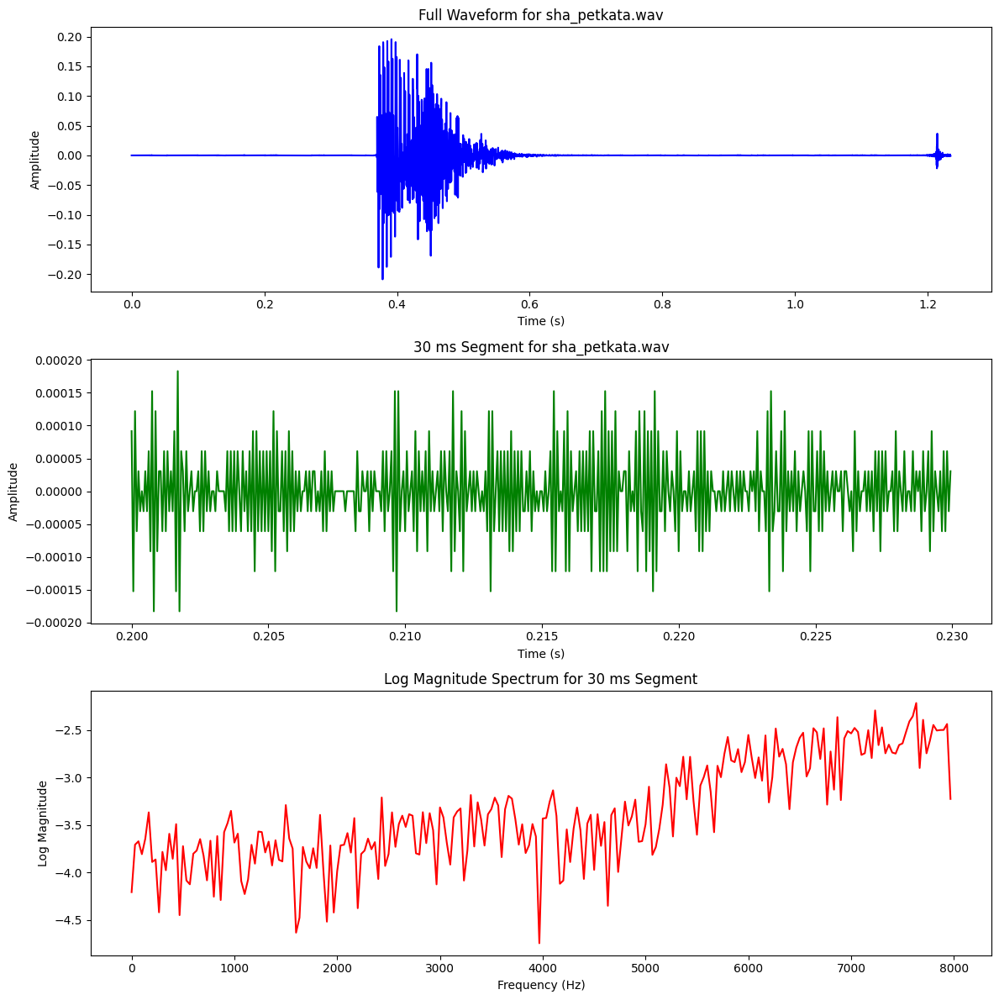

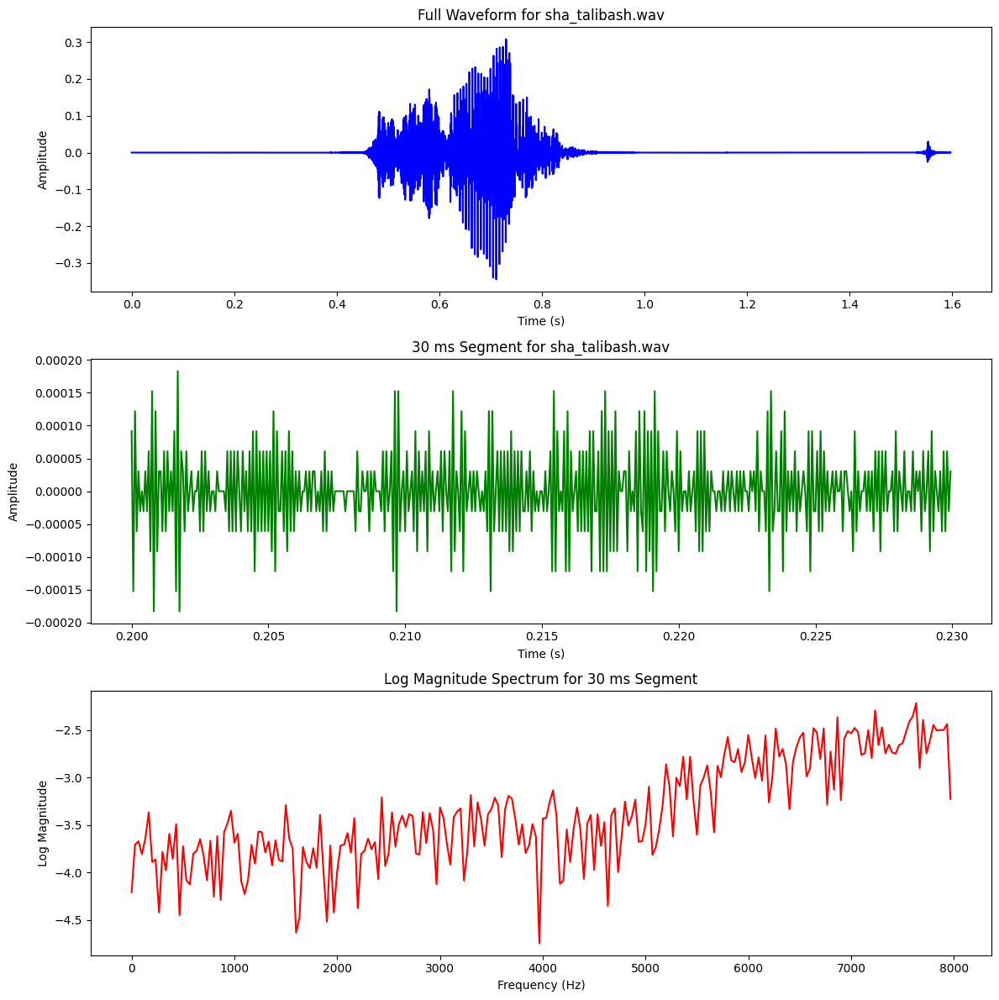

In [21]:
##
folder_path = "Consonants\\Fricatives"
files = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith('.wav')]

for file in files:
    plot_combined_with_full_waveform(file, start_time=0.2)

## Consonents - Semivowels

C:\Users\ghs6kor\AppData\Local\Temp\ipykernel_34192\1710049350.py:24: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  magnitude_spectrum = np.abs(fft_result)[:N // 2]
C:\Users\ghs6kor\AppData\Local\Temp\ipykernel_34192\1710049350.py:25: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  log_magnitude = np.log10(magnitude_spectrum + 1e-6)


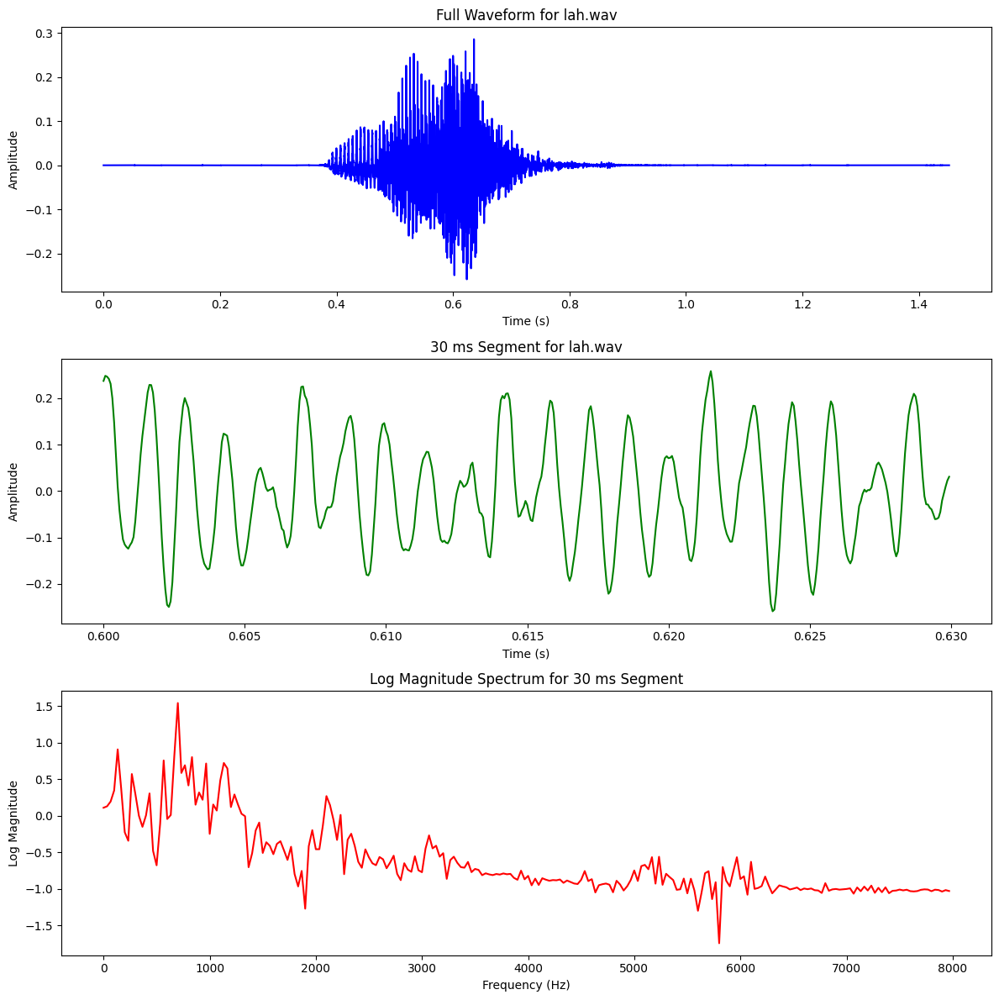

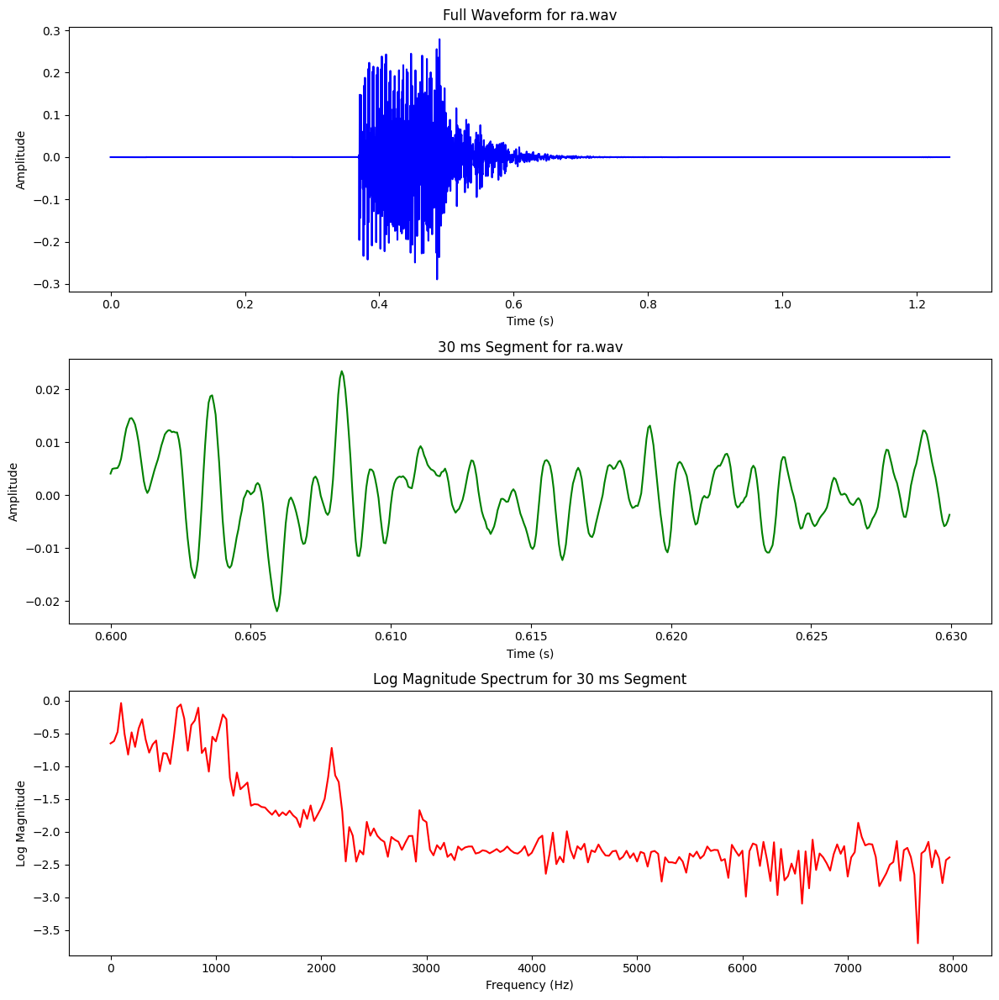

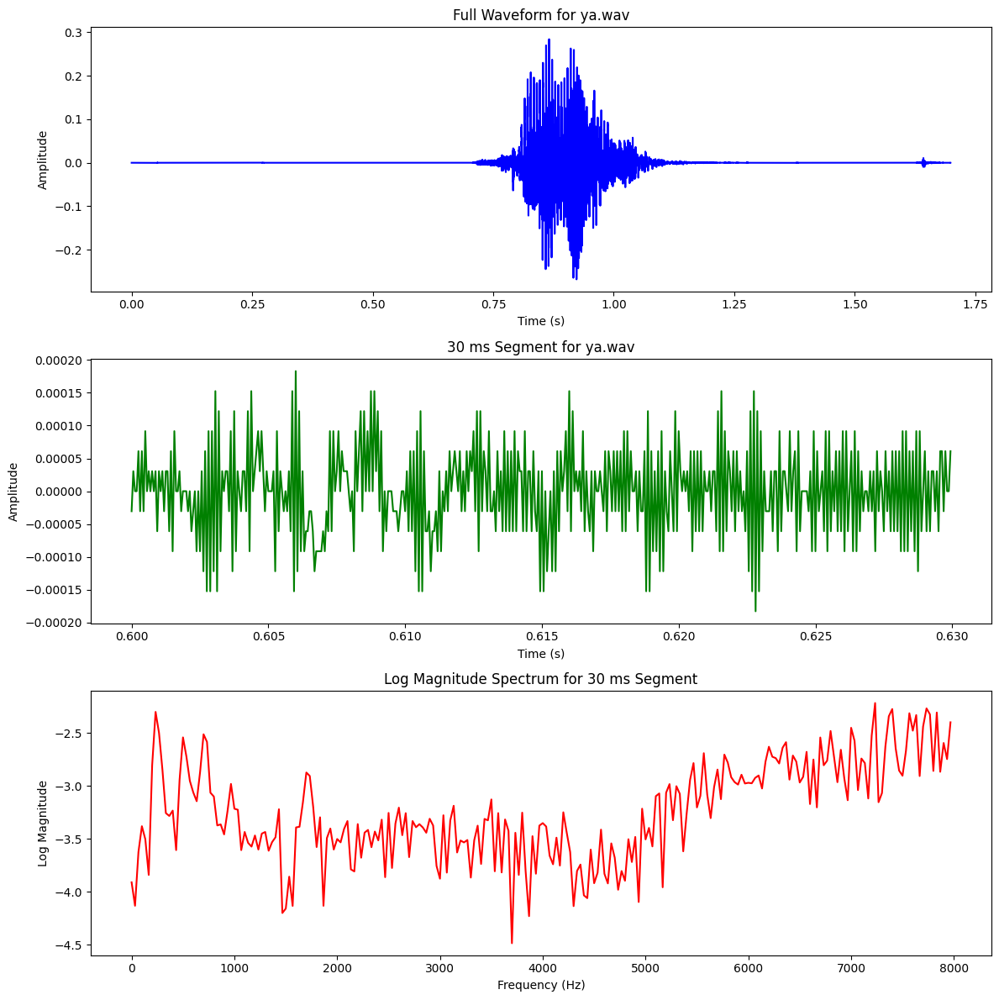

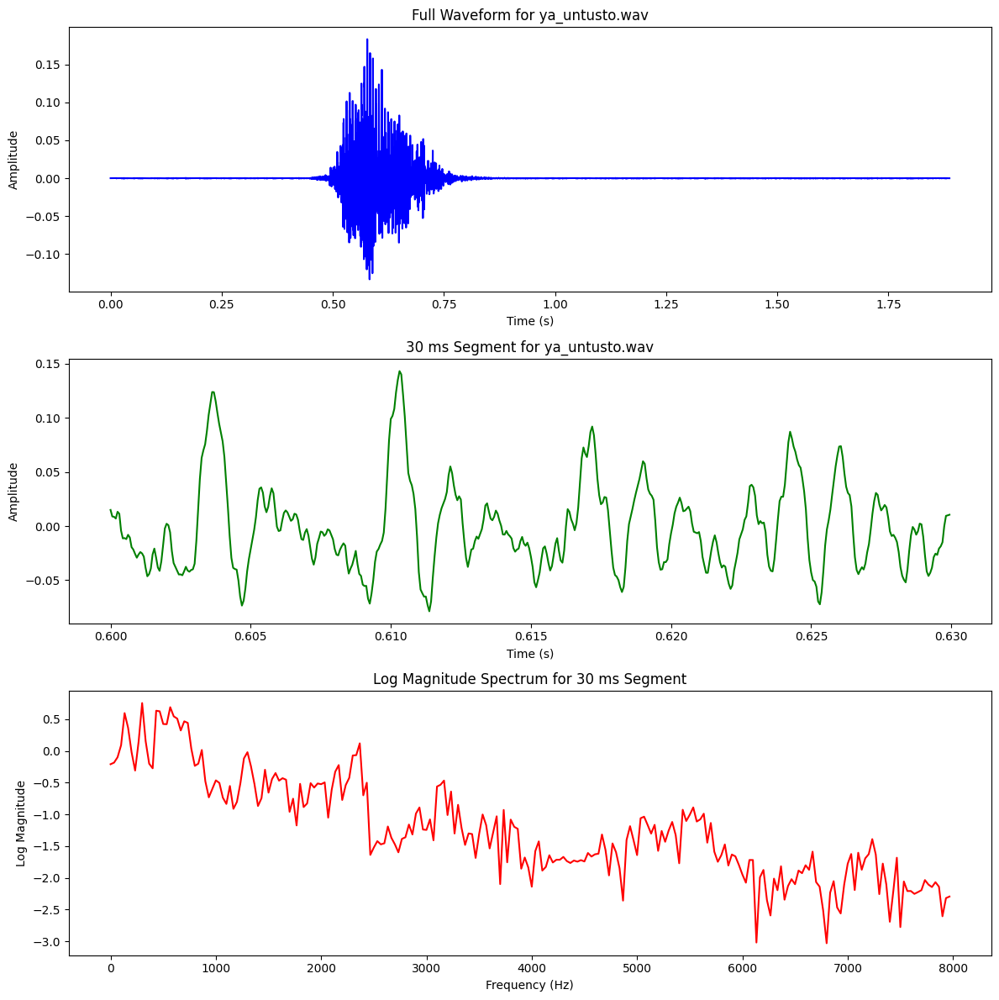

In [18]:
##
folder_path = "Consonants\\Semivowels"
files = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith('.wav')]

for file in files:
    plot_combined_with_full_waveform(file, start_time=0.6)

## Consonents - Affricates

C:\Users\ghs6kor\AppData\Local\Temp\ipykernel_34192\1710049350.py:24: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  magnitude_spectrum = np.abs(fft_result)[:N // 2]
C:\Users\ghs6kor\AppData\Local\Temp\ipykernel_34192\1710049350.py:25: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  log_magnitude = np.log10(magnitude_spectrum + 1e-6)


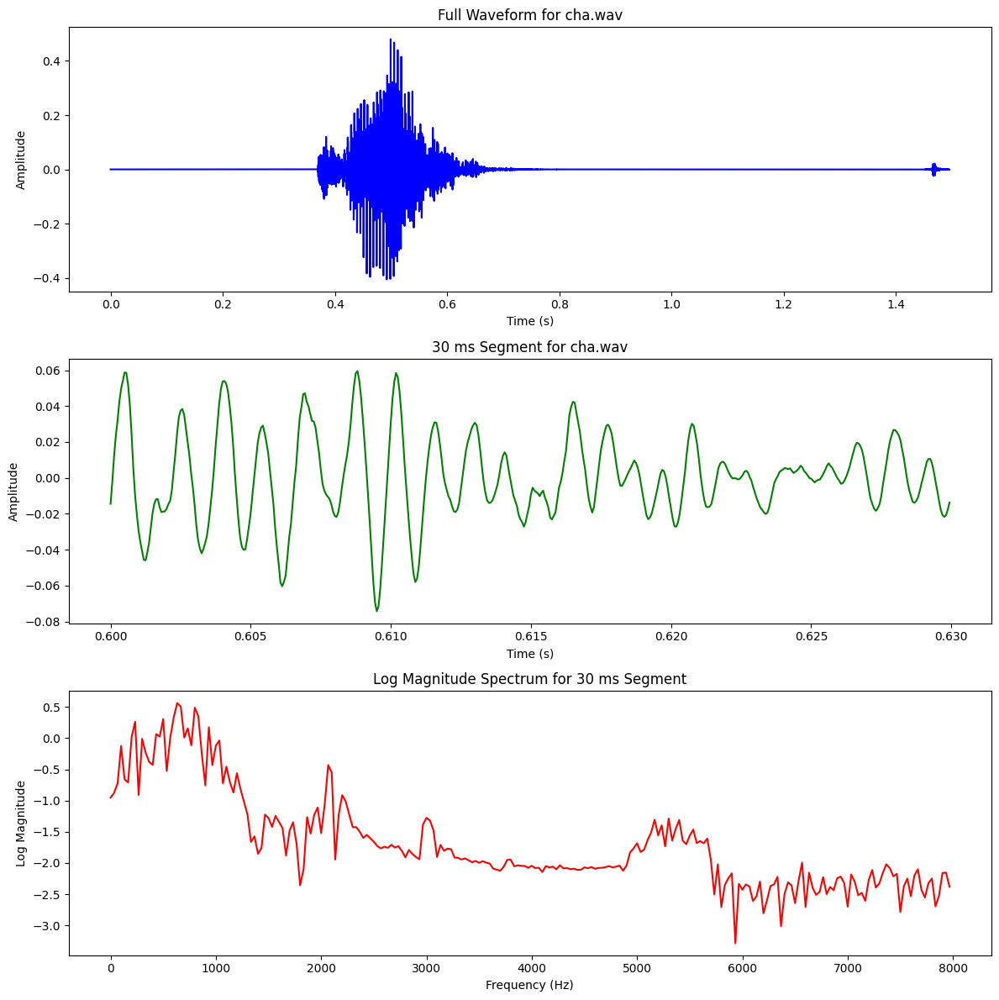

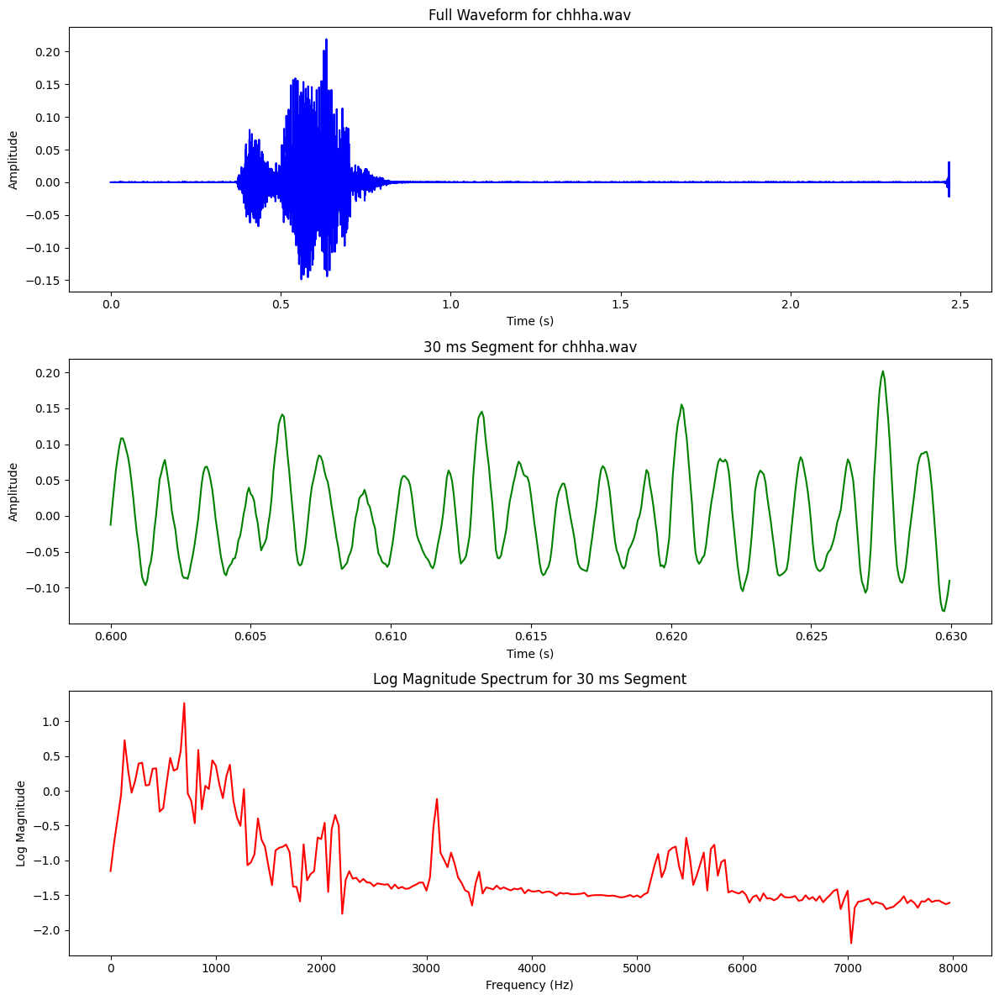

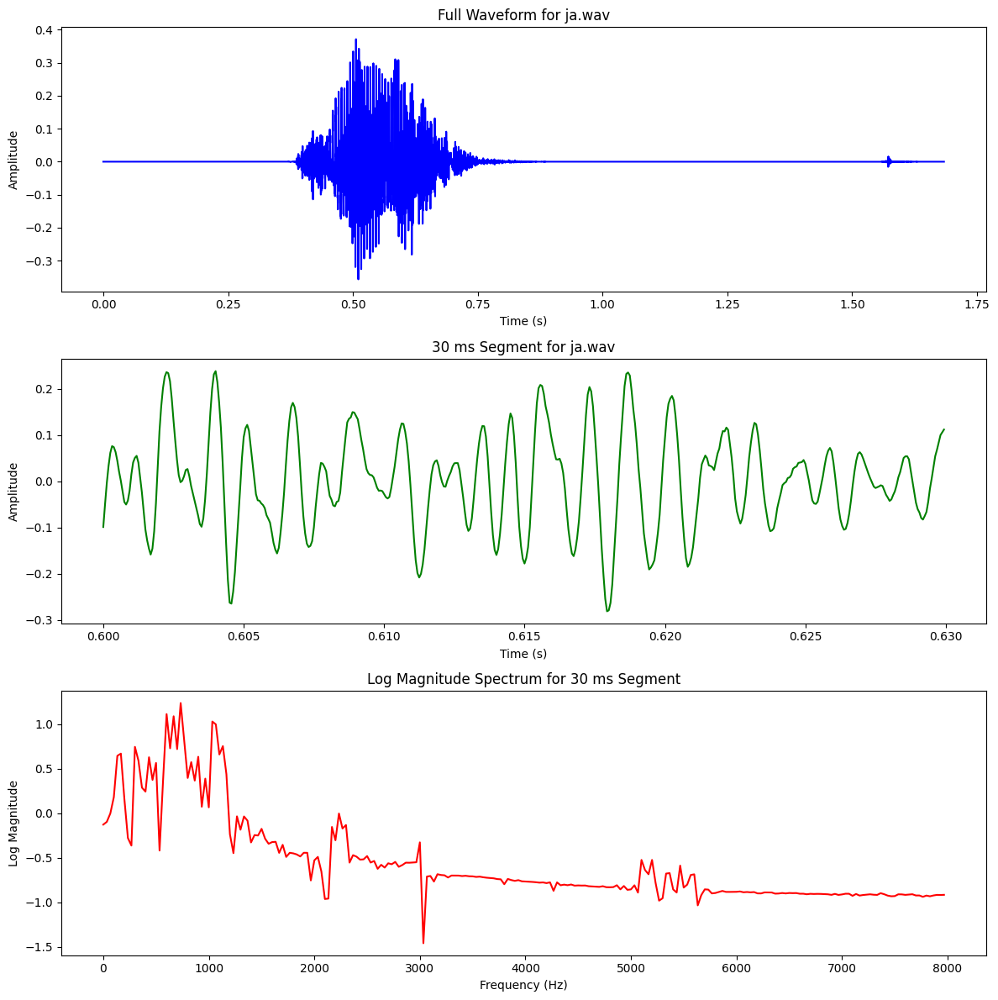

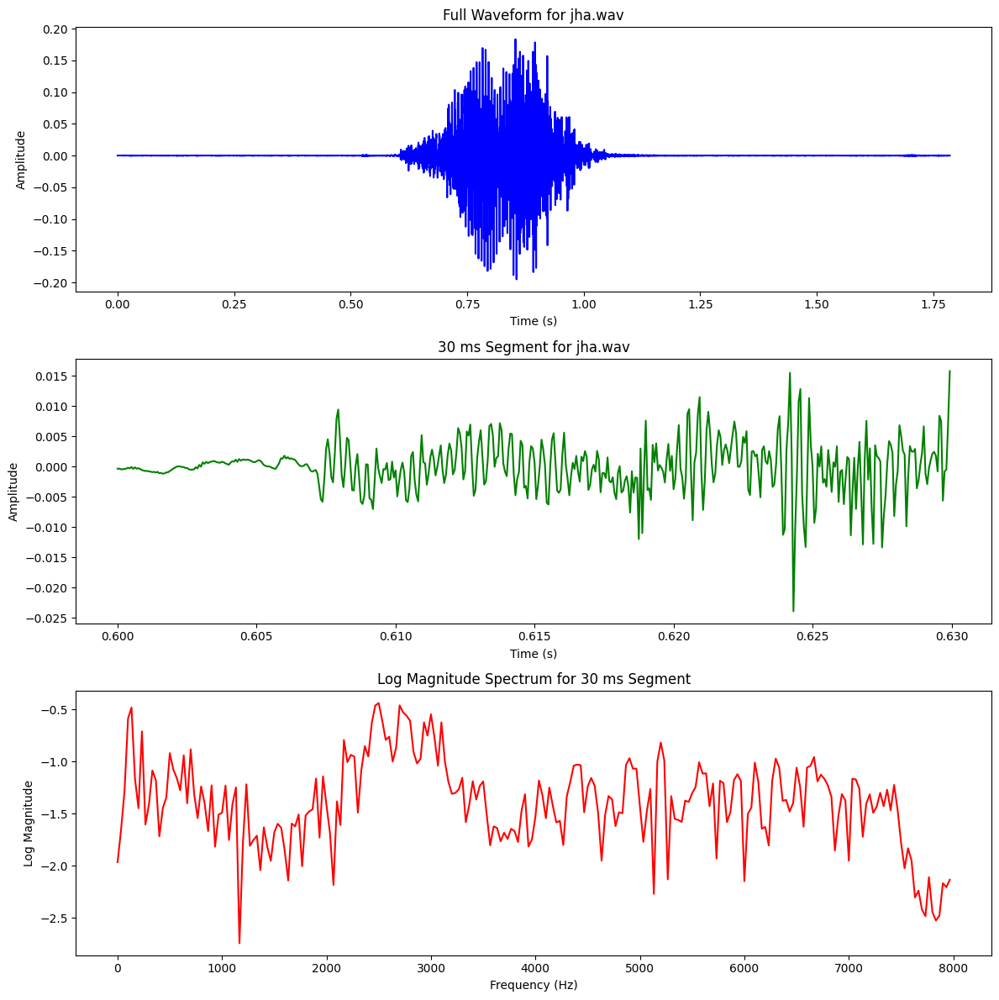

In [19]:
##
folder_path = "Consonants\\Affricates"
files = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith('.wav')]

for file in files:
    plot_combined_with_full_waveform(file, start_time=0.6)

## Stops with Vowels

C:\Users\ghs6kor\AppData\Local\Temp\ipykernel_34192\1710049350.py:24: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  magnitude_spectrum = np.abs(fft_result)[:N // 2]
C:\Users\ghs6kor\AppData\Local\Temp\ipykernel_34192\1710049350.py:25: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  log_magnitude = np.log10(magnitude_spectrum + 1e-6)


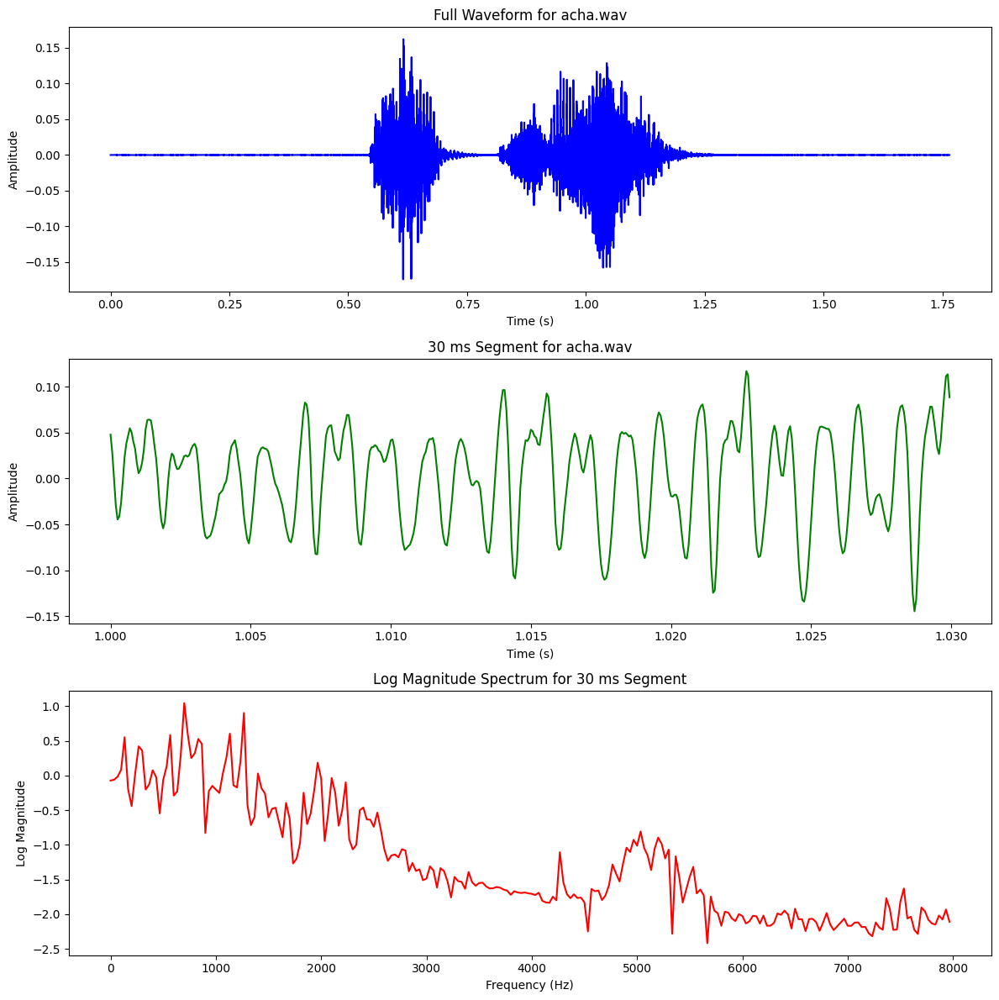

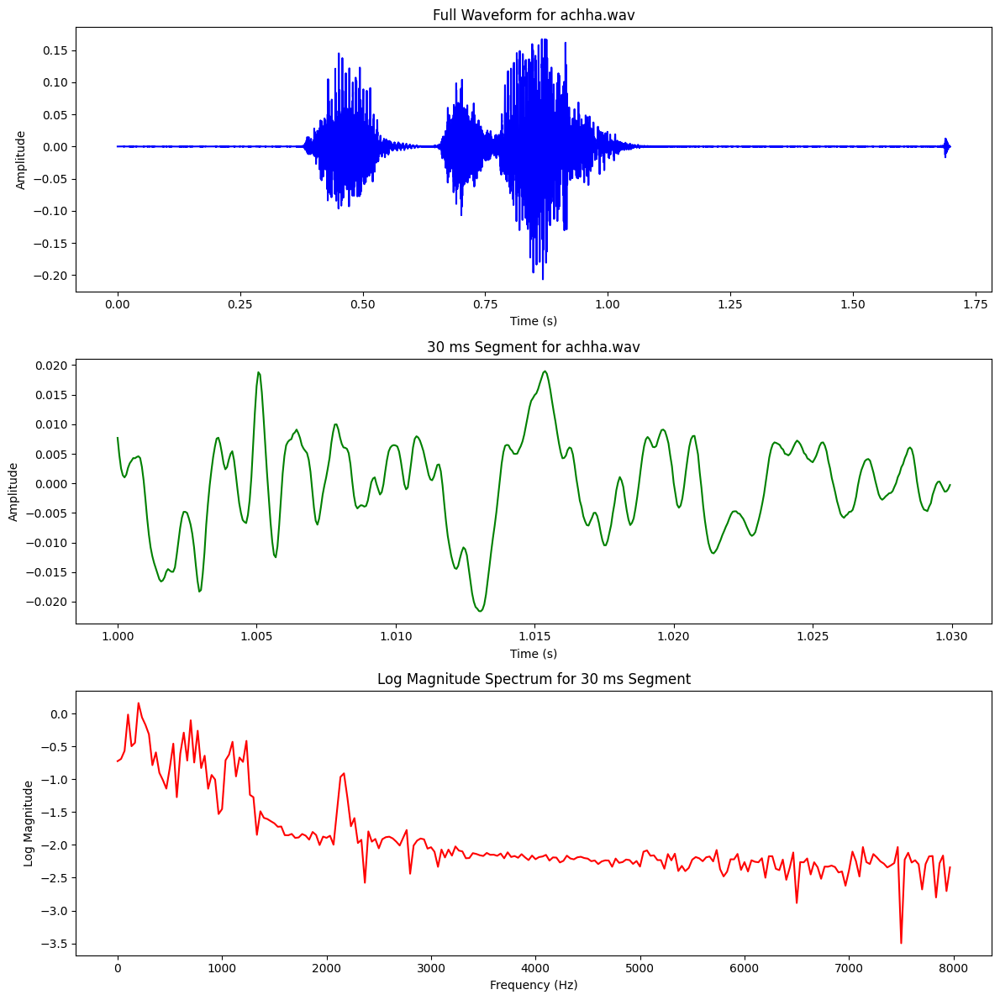

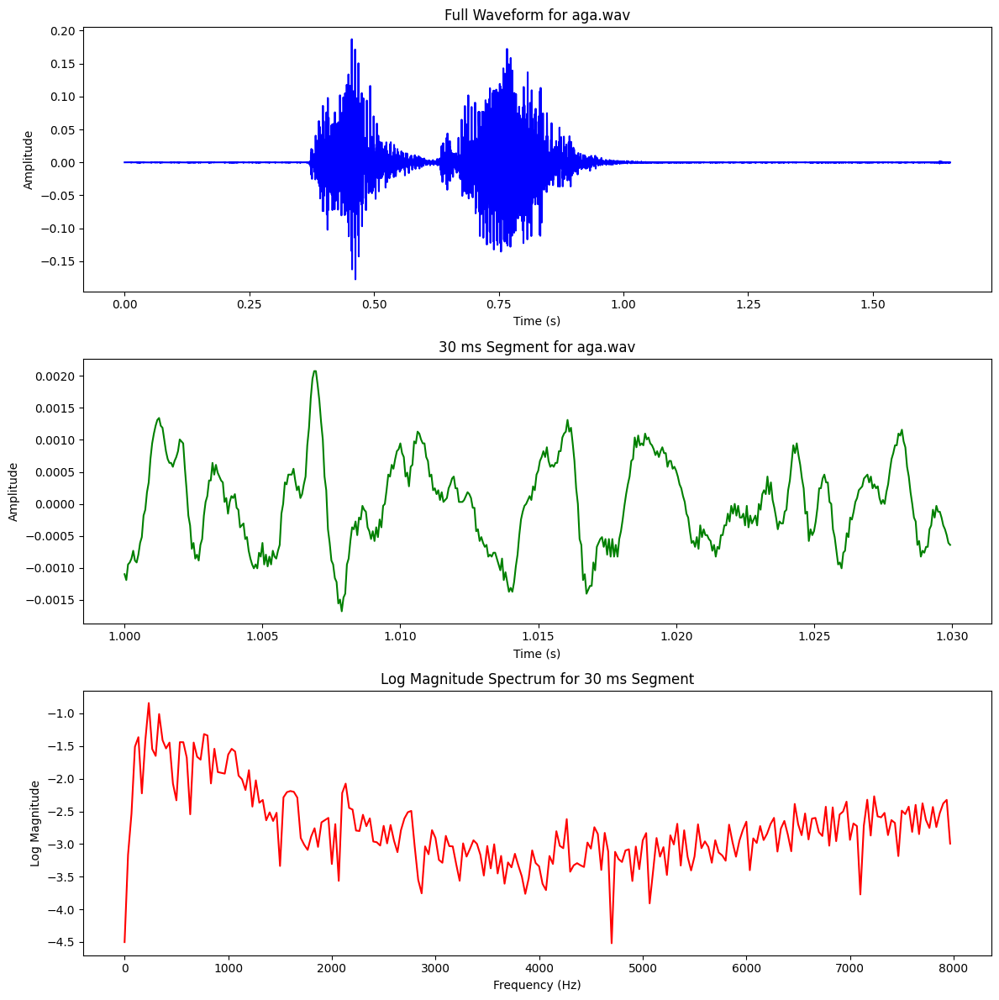

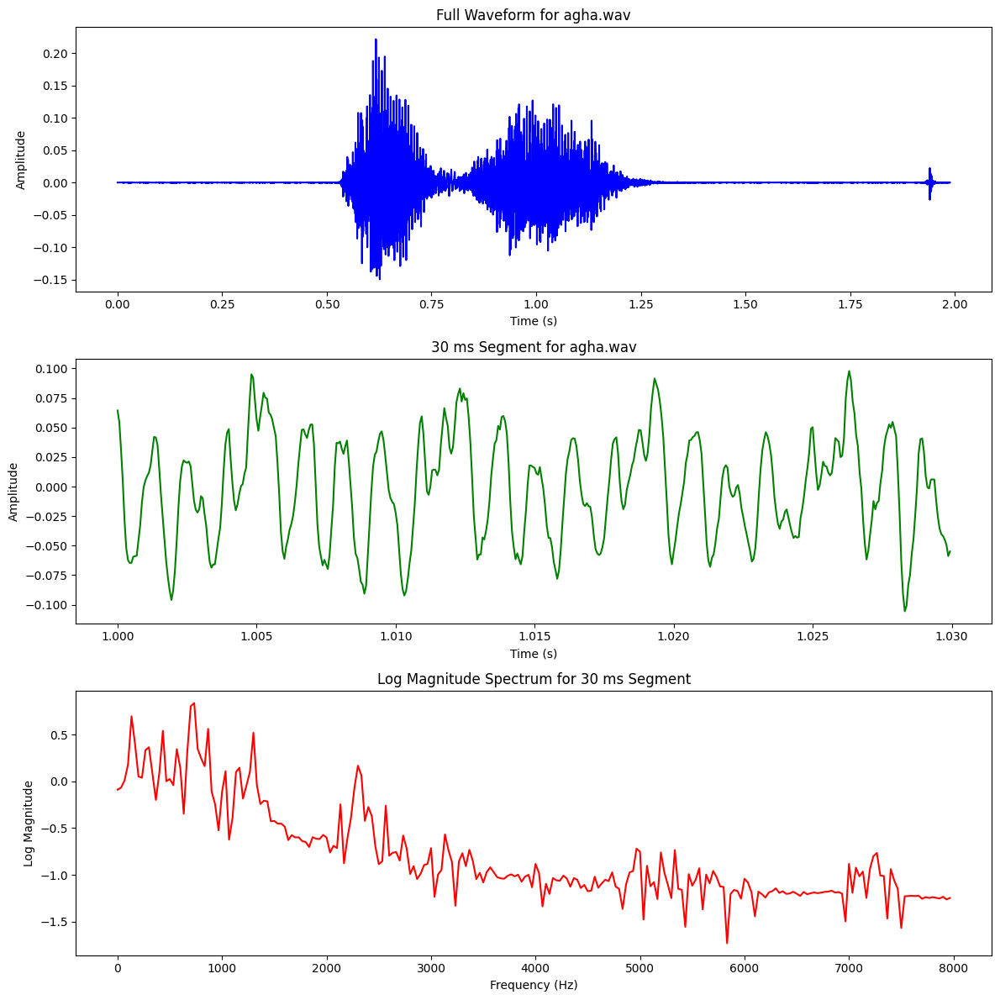

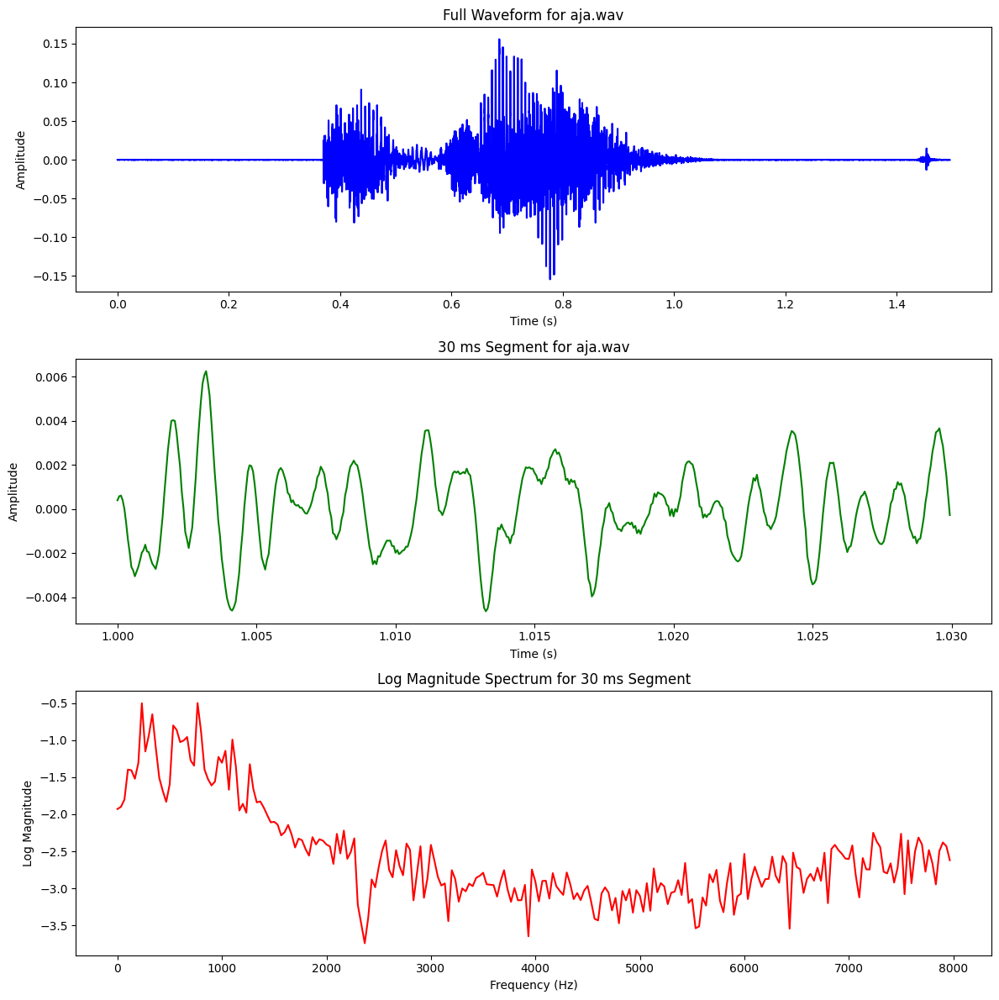

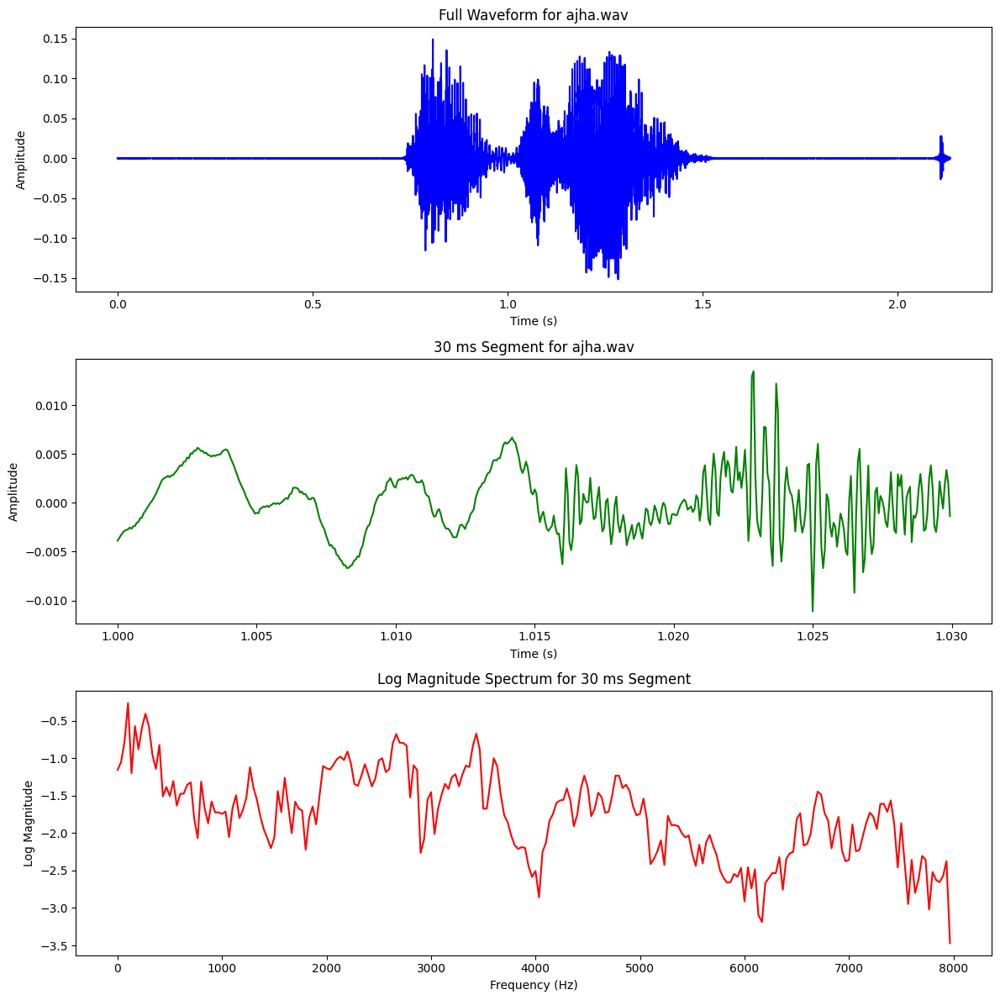

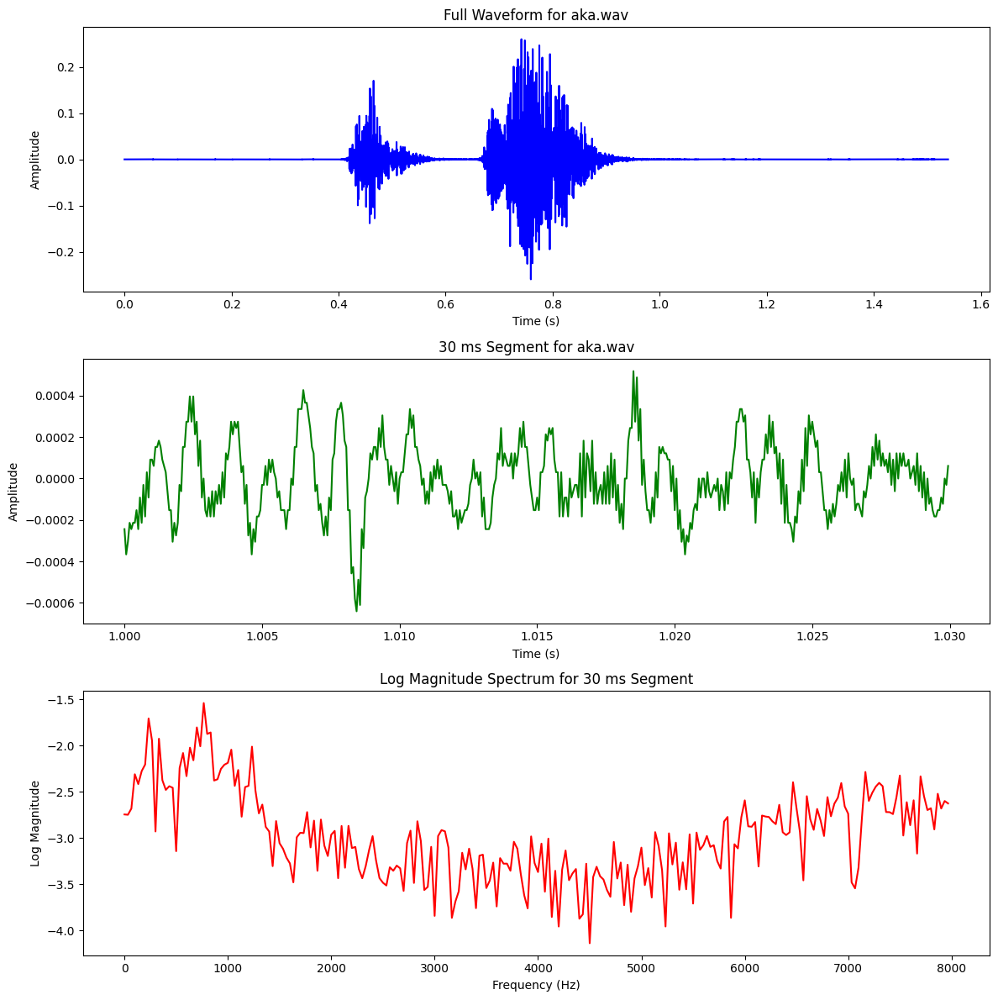

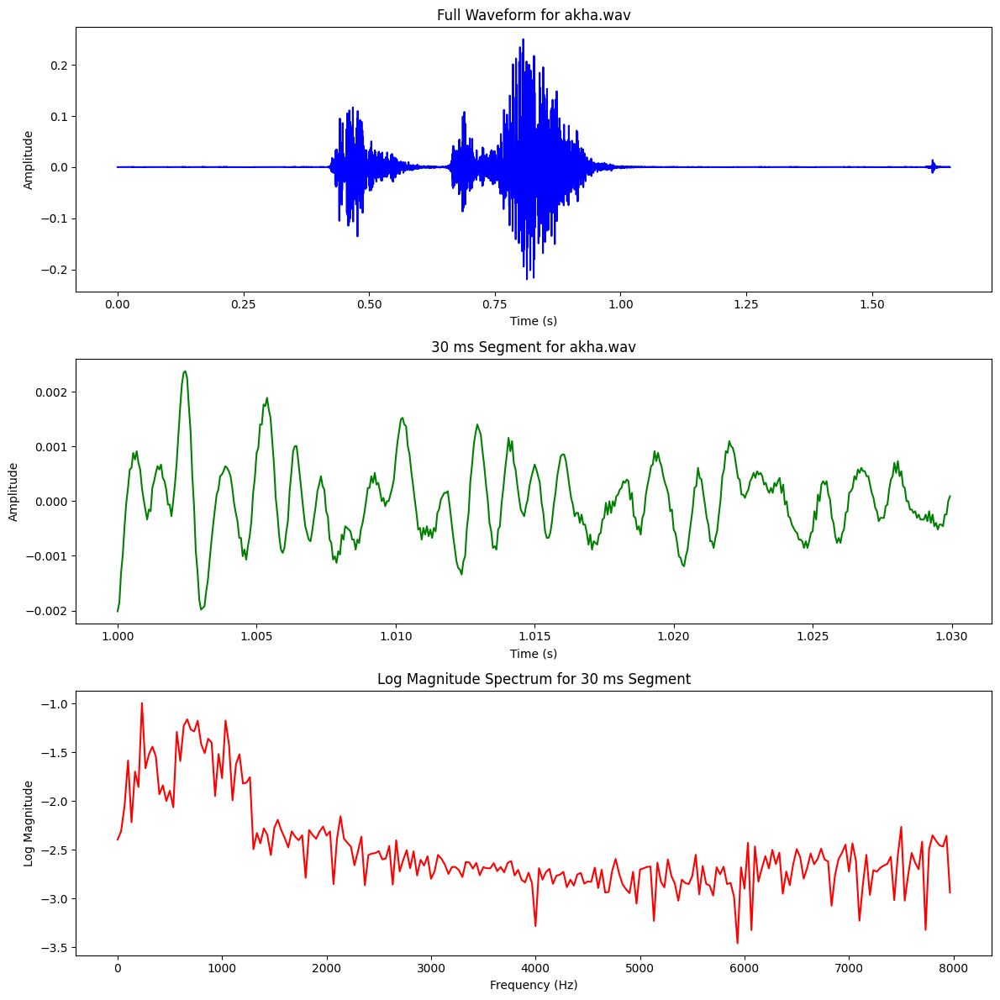

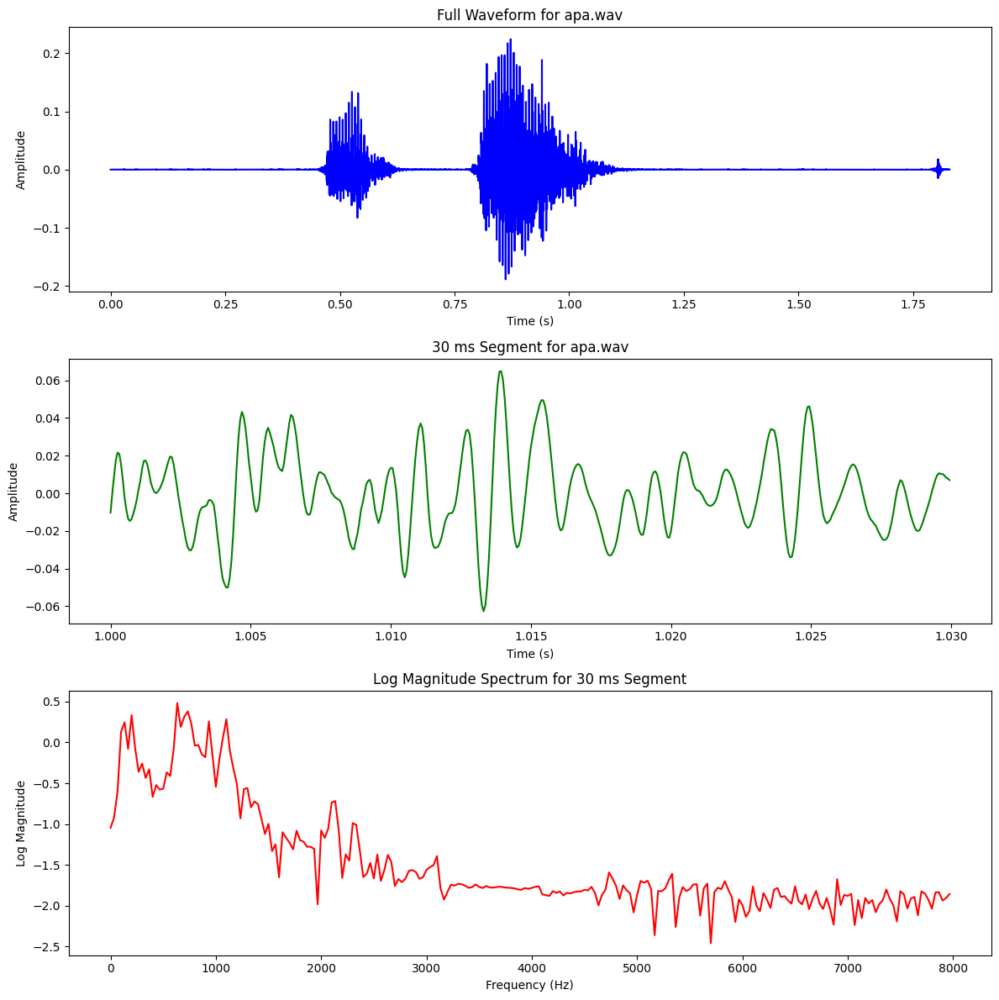

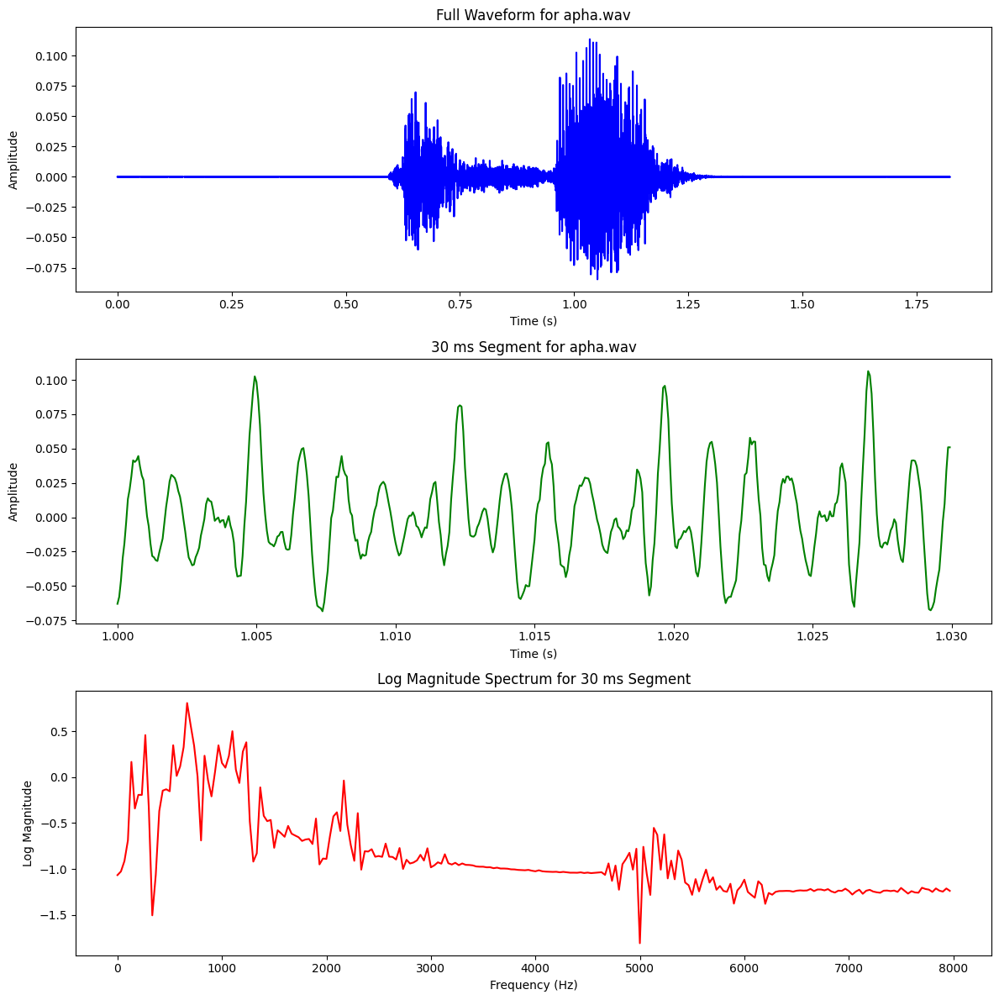

In [20]:
folder_path = "StopConsonentsVowels"
files = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith('.wav')]

for file in files:
    plot_combined_with_full_waveform(file, start_time=1.0)
    

# Observations and Analysis
○ Note your observations for each sound unit, including:
■ Place of articulation
■ Manner of articulation

# Bengali Consonants - Place and Manner of Articulation

| **Consonant** | **Place of Articulation**   | **Manner of Articulation**      |
|---------------|-----------------------------|--------------------------------|
| **ক (ka)**    | Velar (Soft palate)         | Stop (Plosive)                 |
| **খ (kha)**   | Velar (Soft palate)         | Aspirated Stop (Plosive)       |
| **গ (ga)**    | Velar (Soft palate)         | Stop (Plosive)                 |
| **ঘ (gha)**   | Velar (Soft palate)         | Aspirated Stop (Plosive)       |
| **ঙ (nga)**   | Velar (Soft palate)         | Nasal                          |
| **চ (cha)**   | Palatal                     | Stop (Plosive)                 |
| **ছ (chha)**  | Palatal                     | Aspirated Stop (Plosive)       |
| **জ (ja)**    | Palatal                     | Stop (Plosive)                 |
| **ঝ (jha)**   | Palatal                     | Aspirated Stop (Plosive)       |
| **ঞ (nya)**   | Palatal                     | Nasal                          |
| **ট (ṭa)**    | Retroflex                   | Stop (Plosive)                 |
| **ঠ (ṭha)**   | Retroflex                   | Aspirated Stop (Plosive)       |
| **ড (ḍa)**    | Retroflex                   | Stop (Plosive)                 |
| **ঢ (ḍha)**   | Retroflex                   | Aspirated Stop (Plosive)       |
| **ণ (ṇa)**    | Retroflex                   | Nasal                          |
| **ত (ta)**    | Dental                      | Stop (Plosive)                 |
| **থ (tha)**   | Dental                      | Aspirated Stop (Plosive)       |
| **দ (da)**    | Dental                      | Stop (Plosive)                 |
| **ধ (dha)**   | Dental                      | Aspirated Stop (Plosive)       |
| **ন (na)**    | Dental                      | Nasal                          |
| **প (pa)**    | Bilabial                    | Stop (Plosive)                 |
| **ফ (pha)**   | Bilabial                    | Aspirated Stop (Plosive)       |
| **ব (ba)**    | Bilabial                    | Stop (Plosive)                 |
| **ভ (bha)**   | Bilabial                    | Aspirated Stop (Plosive)       |
| **ম (ma)**    | Bilabial                    | Nasal                          |
| **য (ya)**    | Palatal                     | Semivowel                      |
| **র (ra)**    | Alveolar                    | Liquid (Flap/Trill)            |
| **ল (la)**    | Alveolar                    | Liquid (Lateral)               |
| **঴ (ṛa)**    | Retroflex                   | Liquid (Flap)                  |
| **ৱ (wa)**    | Bilabial                    | Semivowel                      |
| **শ (sha)**   | Palatal                     | Fricative                      |
| **ষ (ṣa)**    | Retroflex                   | Fricative                      |
| **স (sa)**    | Alveolar                    | Fricative                      |
| **হ (ha)**    | Glottal                     | Fricative                      |
| **ক্ষ (kṣa)** | Velar + Palatal             | Affricate                      |
| **ত্র (tra)** | Alveolar + Retroflex        | Affricate                      |
| **জ্ঞ (gya)** | Palatal + Palatal           | Affricate                      |


### To be mod

2. Plotting 30 ms Segments
What it shows:

By zooming into small 30 ms segments, you can visualize the finer details of the signal’s local variation.
This segment-based view helps analyze individual phonemes (such as vowels and consonants), providing insight into their temporal structure and articulatory characteristics.
Possible Conclusions:

Phoneme Duration: You can observe how long individual phonemes (vowels, consonants) last and whether they have a sharp attack (e.g., plosives) or a smooth transition (e.g., vowels).
Transition Between Sounds: The transition from one phoneme to the next (e.g., between a consonant and vowel) can be examined for clarity and sharpness.
Speech Clarity: Clear, distinct phonemes will show well-separated segments, whereas merged or indistinct phonemes (due to unclear speech or noise) might appear as overlapping segments.
3. Log Magnitude Spectrum (Frequency Domain)
What it shows:

The log magnitude spectrum provides insight into the frequency content of the speech signal, highlighting how energy is distributed across various frequencies.
By using the Fast Fourier Transform (FFT), you can observe the energy distribution and peaks at different frequencies, identifying which frequency ranges are dominant in the speech signal.
Possible Conclusions:

Formants in Vowels: Vowel sounds, which have a clear, distinct frequency pattern, will show peaks at certain frequencies (e.g., around 300 Hz for the first formant, 1500 Hz for the second formant in normal speech). You can identify the specific formants for vowels based on these frequency peaks.
Consonant Noise: For consonants like fricatives (e.g., /ʃ/ or /s/), the frequency spectrum will show broad, continuous energy spread across a range of frequencies, reflecting their noisy nature.
Stop Consonant Release: The spectral representation of stop consonants (e.g., /p/, /b/) will show a burst of high-frequency energy corresponding to the release of the stop, followed by a period of silence.
Energy in High and Low Frequencies: Speech sounds such as nasals will generally show more low-frequency energy compared to other consonants, which might have energy distributed across both high and low frequencies.
Voiced vs Unvoiced Sounds: Voiced sounds (e.g., vowels and nasals) have more energy in the lower frequency ranges, while unvoiced sounds (e.g., fricatives) have energy spread across higher frequencies.